In [25]:
# Imports
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from keras.layers import Input, Flatten, Dense
from keras.models import Model, Sequential
from keras.backend import softmax
from keras import optimizers
import numpy as np
from scipy.ndimage.filters import median_filter
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
import cv2
import time
import os

In [26]:
def get_new_state(cur_img, action):

    if action == "w":
        # Weiner filter
        pass
    elif action == "m":
        # Median filter 3 x 3
        return median_filter(image, size=(3,3))
    elif action == "s":
        # Sharpening filter
        kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
        return cv2.filter2D(cur_img, -1, kernel)
    else:
        return np.array([])

In [27]:
class DNN(object):
    
    def __init__(self):
        self.model = self.get_model()
        
    def get_model(self):
        #Add the fully-connected layers 
        model = Sequential()
        model.add(Dense(200, input_dim=20000, name = "l1"))
        
        for k in range(5):
            model.add(Dense(200, activation='relu', name = "il"+str(k)))
        
        model.add(Dense(50, name="last_prev"))
        model.add(Dense(2, activation='softmax', name="output_scores"))
        sgd = optimizers.SGD(lr=0.005, decay=1e-6, momentum=0.5, nesterov=True)
        model.compile(loss='binary_crossentropy', optimizer=sgd, metrics=['accuracy'])
        
        return model
    
    def train(self, x, y, epochs=10):
        
        self.model.fit(x, y, epochs=epochs)
        
        return self.model.evaluate(x, y)
    
    def predict(self, x):
        
        return self.model.predict(x, verbose=1)
        

In [28]:
def get_data():
    x = []
    y = []

    for i in os.listdir("data/train/enhanced/"):
        img_original_path = "data/train/original/{}"
        img_original = cv2.imread(img_original_path.format(i), 0)

        img_enhanced_path = "data/train/enhanced/{}"
        img_enhanced = cv2.imread(img_enhanced_path.format(i), 0)

        x.append(np.reshape([img_original, img_enhanced], 20000))
        y.append(np.array([1.0, 0.0]))

    return np.array(x),np.array(y)

In [29]:
x,y = get_data()

 Iteration :  1  ,  1
 #### Original ####


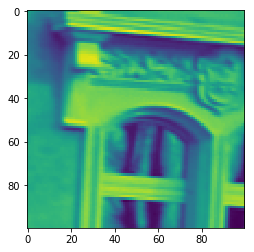

 #### Transformed ####


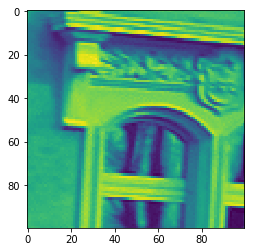

 Iteration :  1  ,  2
 #### Original ####


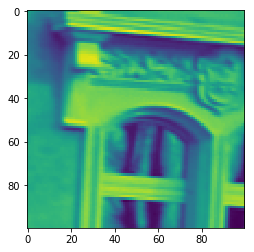

 #### Transformed ####


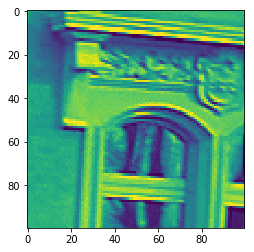

 Iteration :  1  ,  3
 #### Original ####


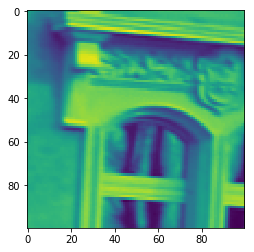

 #### Transformed ####


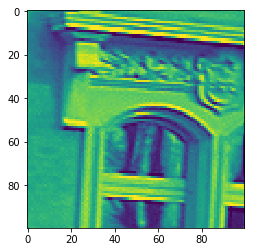

 Iteration :  1  ,  4
 #### Original ####


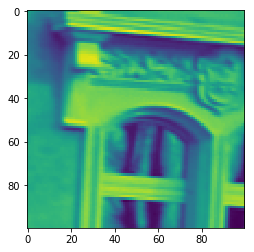

 #### Transformed ####


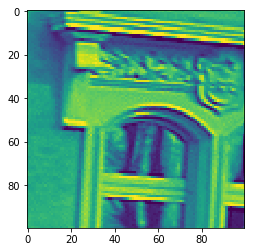

 Iteration :  1  ,  5
 #### Original ####


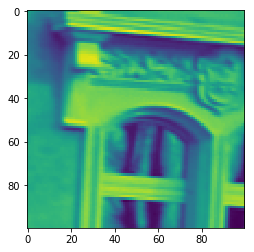

 #### Transformed ####


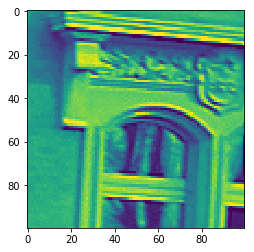

 Iteration :  1  ,  6
 #### Original ####


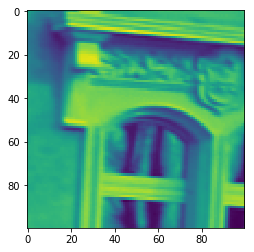

 #### Transformed ####


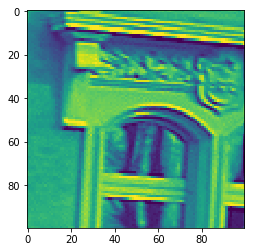

 Iteration :  1  ,  7
 #### Original ####


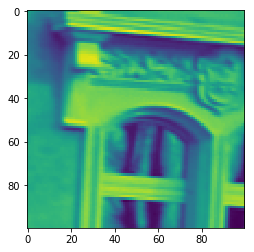

 #### Transformed ####


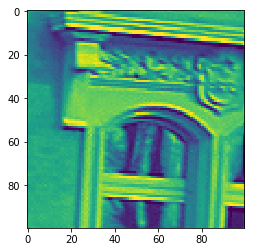

 Iteration :  1  ,  8
 #### Original ####


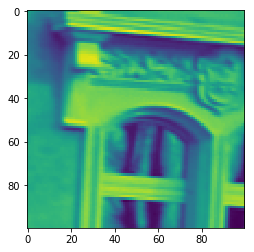

 #### Transformed ####


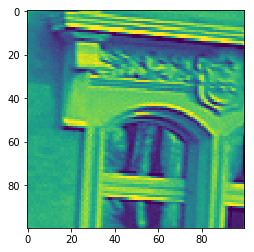

 Iteration :  1  ,  9
 #### Original ####


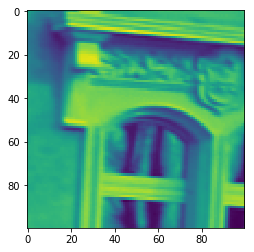

 #### Transformed ####


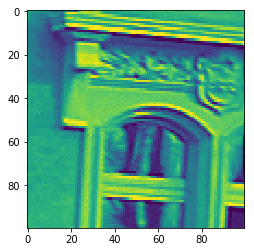

 Iteration :  2  ,  1
 #### Original ####


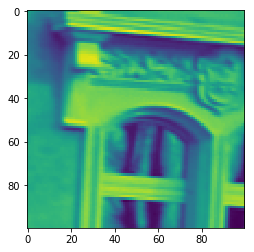

 #### Transformed ####


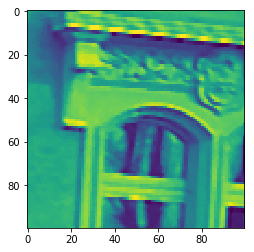

 Iteration :  2  ,  2
 #### Original ####


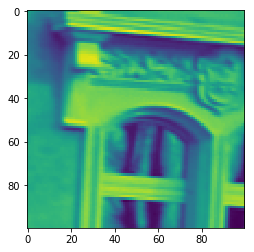

 #### Transformed ####


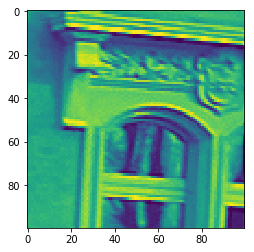

 Iteration :  2  ,  3
 #### Original ####


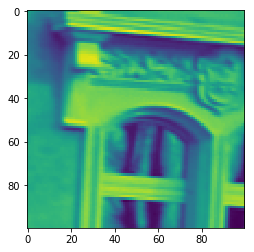

 #### Transformed ####


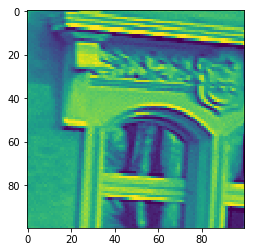

 Iteration :  2  ,  4
 #### Original ####


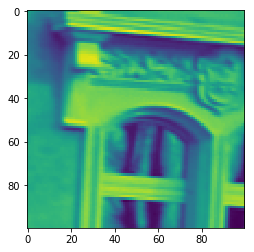

 #### Transformed ####


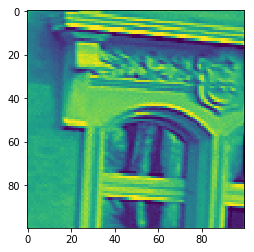

 Iteration :  2  ,  5
 #### Original ####


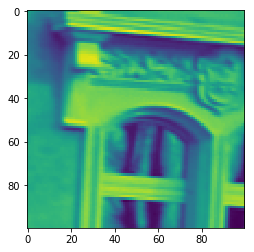

 #### Transformed ####


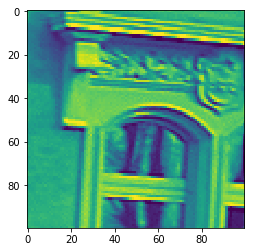

 Iteration :  2  ,  6
 #### Original ####


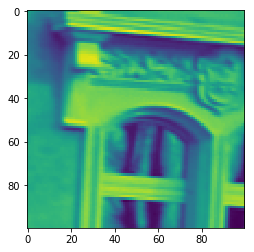

 #### Transformed ####


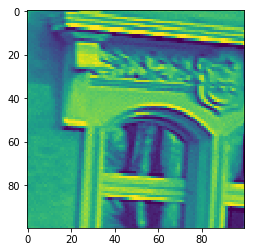

 Iteration :  2  ,  7
 #### Original ####


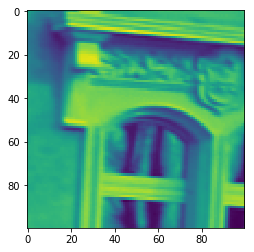

 #### Transformed ####


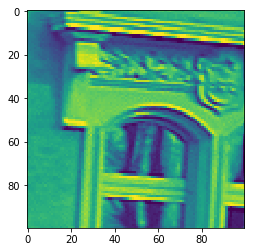

 Iteration :  2  ,  8
 #### Original ####


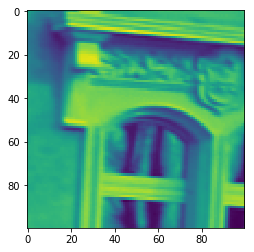

 #### Transformed ####


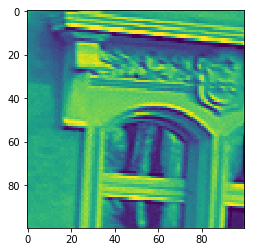

 Iteration :  2  ,  9
 #### Original ####


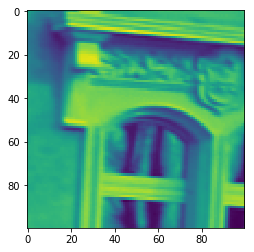

 #### Transformed ####


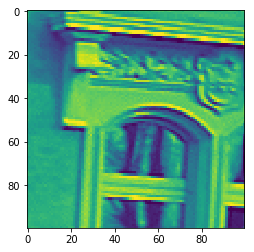

 Iteration :  3  ,  1
 #### Original ####


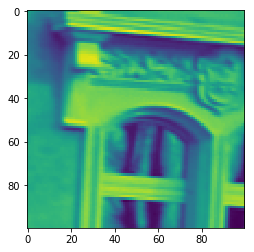

 #### Transformed ####


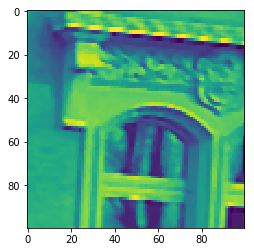

 Iteration :  3  ,  2
 #### Original ####


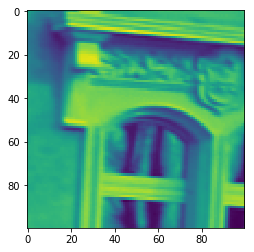

 #### Transformed ####


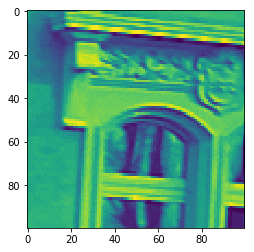

 Iteration :  3  ,  3
 #### Original ####


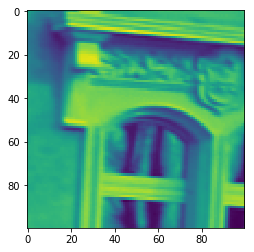

 #### Transformed ####


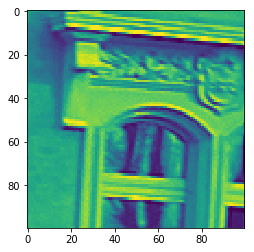

 Iteration :  3  ,  4
 #### Original ####


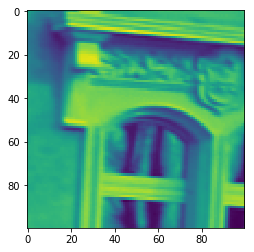

 #### Transformed ####


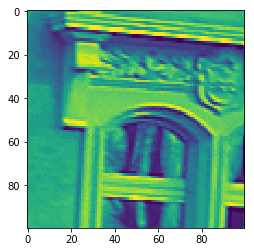

 Iteration :  3  ,  5
 #### Original ####


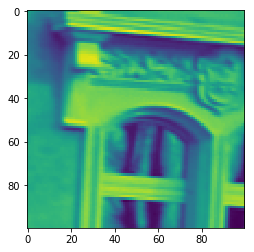

 #### Transformed ####


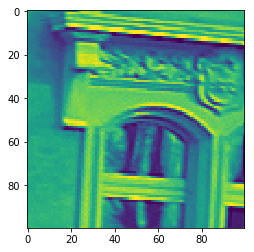

 Iteration :  3  ,  6
 #### Original ####


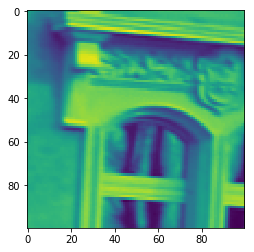

 #### Transformed ####


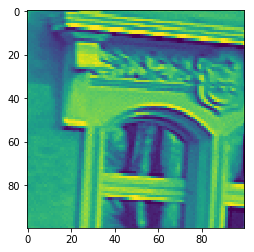

 Iteration :  3  ,  7
 #### Original ####


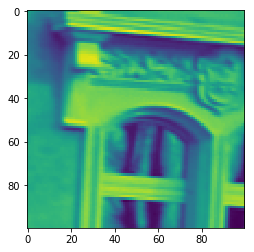

 #### Transformed ####


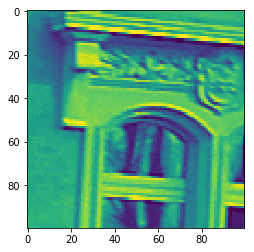

 Iteration :  3  ,  8
 #### Original ####


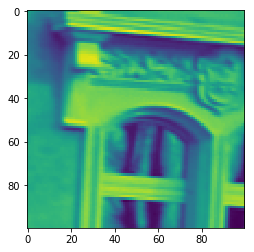

 #### Transformed ####


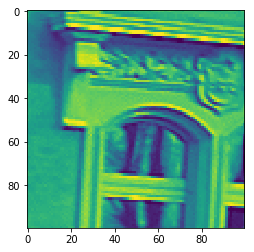

 Iteration :  3  ,  9
 #### Original ####


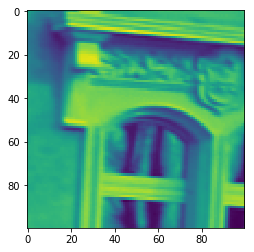

 #### Transformed ####


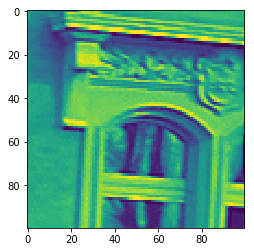

 Iteration :  4  ,  1
 #### Original ####


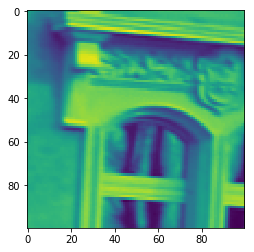

 #### Transformed ####


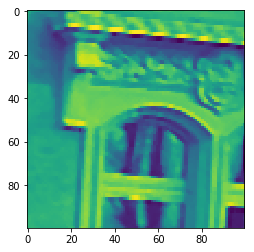

 Iteration :  4  ,  2
 #### Original ####


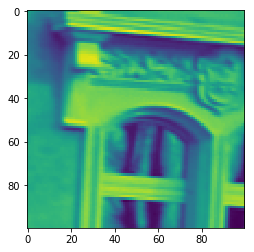

 #### Transformed ####


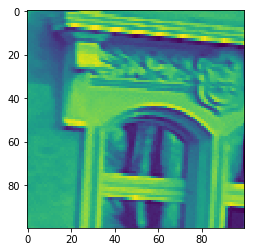

 Iteration :  4  ,  3
 #### Original ####


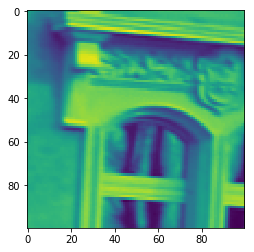

 #### Transformed ####


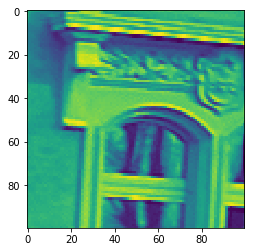

 Iteration :  4  ,  4
 #### Original ####


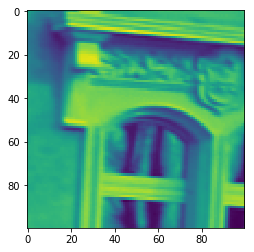

 #### Transformed ####


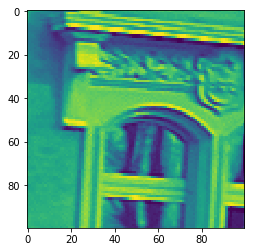

 Iteration :  4  ,  5
 #### Original ####


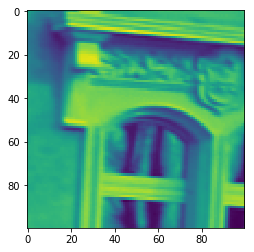

 #### Transformed ####


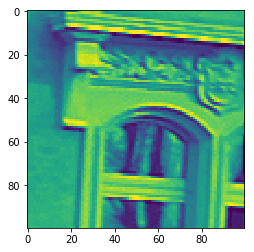

 Iteration :  4  ,  6
 #### Original ####


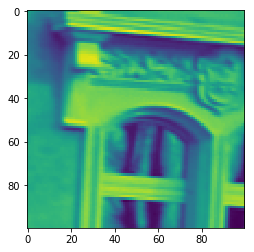

 #### Transformed ####


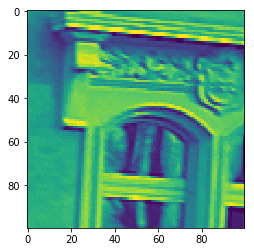

 Iteration :  4  ,  7
 #### Original ####


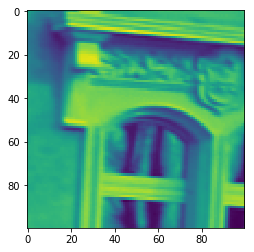

 #### Transformed ####


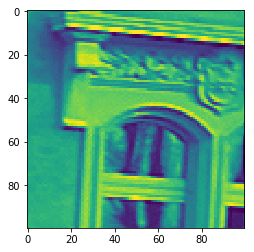

 Iteration :  4  ,  8
 #### Original ####


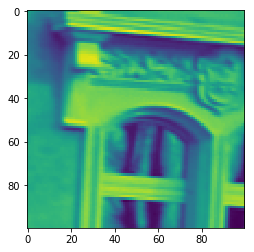

 #### Transformed ####


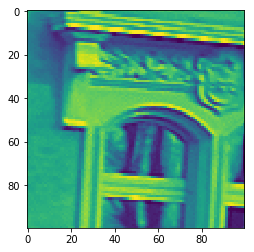

 Iteration :  4  ,  9
 #### Original ####


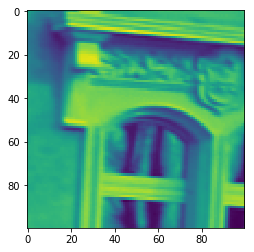

 #### Transformed ####


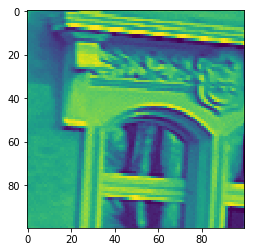

 Iteration :  5  ,  1
 #### Original ####


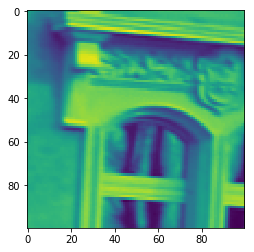

 #### Transformed ####


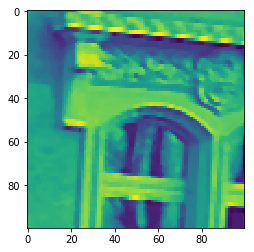

 Iteration :  5  ,  2
 #### Original ####


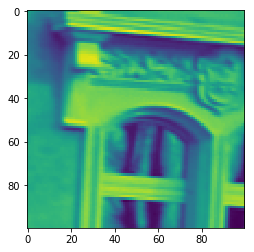

 #### Transformed ####


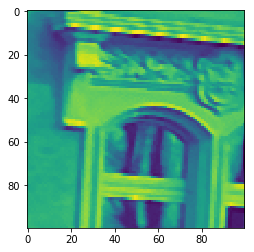

 Iteration :  5  ,  3
 #### Original ####


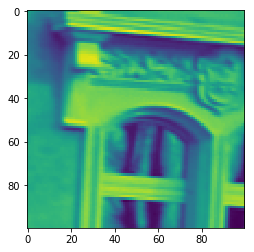

 #### Transformed ####


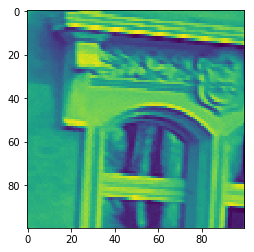

 Iteration :  5  ,  4
 #### Original ####


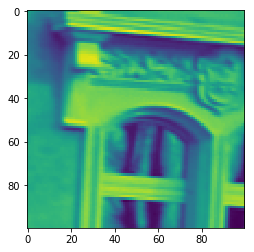

 #### Transformed ####


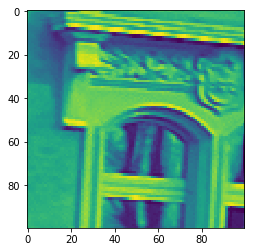

 Iteration :  5  ,  5
 #### Original ####


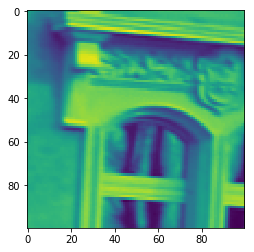

 #### Transformed ####


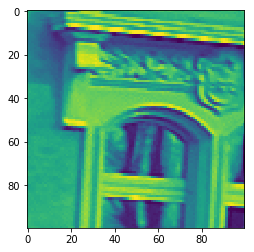

 Iteration :  5  ,  6
 #### Original ####


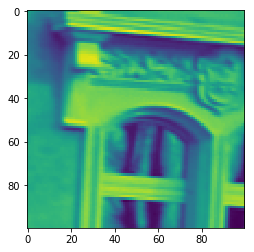

 #### Transformed ####


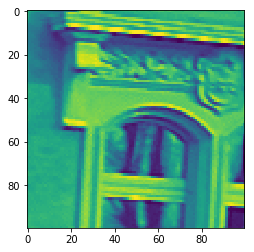

 Iteration :  5  ,  7
 #### Original ####


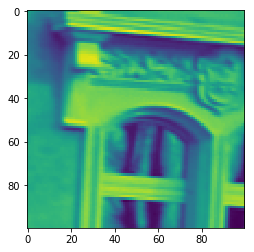

 #### Transformed ####


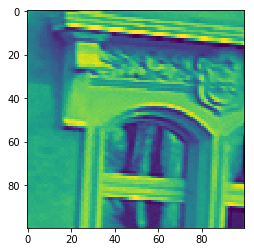

 Iteration :  5  ,  8
 #### Original ####


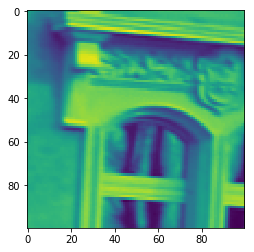

 #### Transformed ####


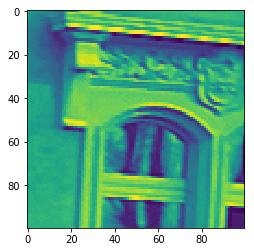

 Iteration :  5  ,  9
 #### Original ####


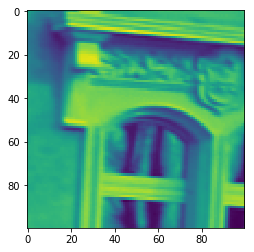

 #### Transformed ####


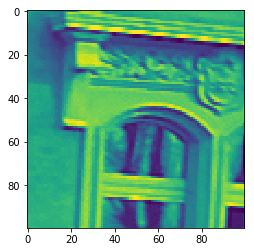

 Iteration :  6  ,  1
 #### Original ####


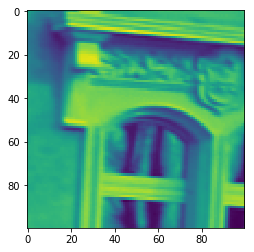

 #### Transformed ####


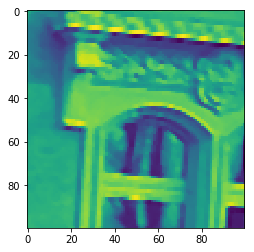

 Iteration :  6  ,  2
 #### Original ####


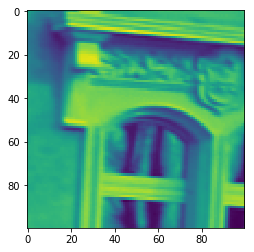

 #### Transformed ####


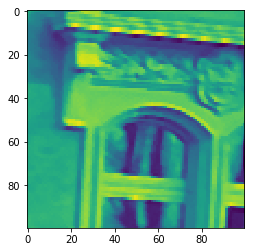

 Iteration :  6  ,  3
 #### Original ####


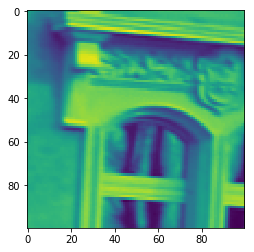

 #### Transformed ####


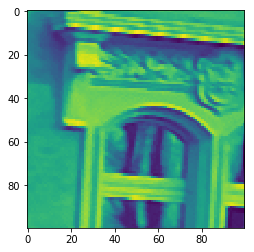

 Iteration :  6  ,  4
 #### Original ####


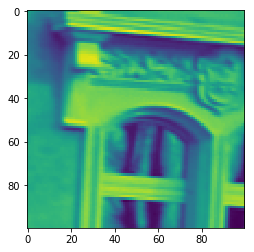

 #### Transformed ####


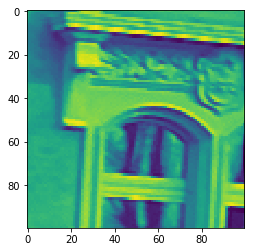

 Iteration :  6  ,  5
 #### Original ####


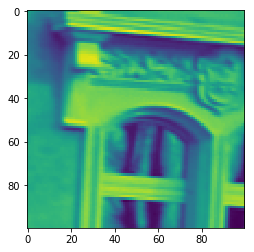

 #### Transformed ####


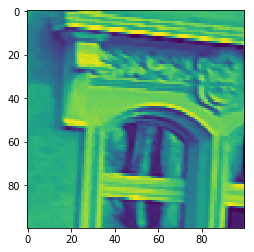

 Iteration :  6  ,  6
 #### Original ####


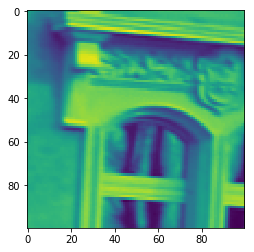

 #### Transformed ####


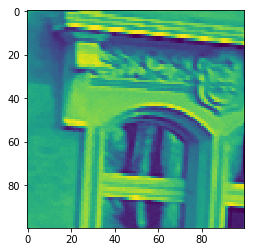

 Iteration :  6  ,  7
 #### Original ####


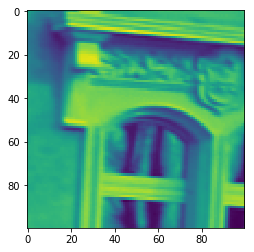

 #### Transformed ####


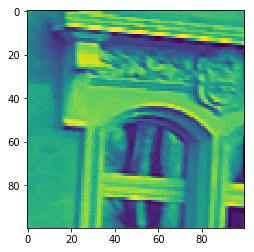

 Iteration :  6  ,  8
 #### Original ####


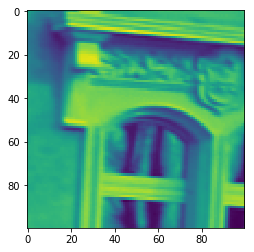

 #### Transformed ####


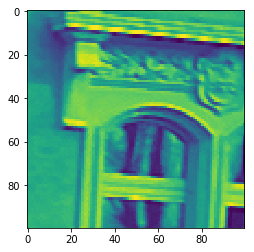

 Iteration :  6  ,  9
 #### Original ####


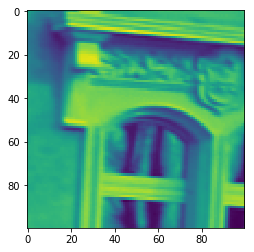

 #### Transformed ####


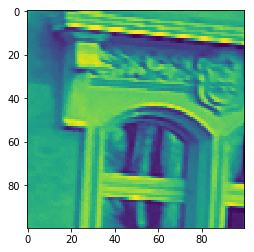

 Iteration :  7  ,  1
 #### Original ####


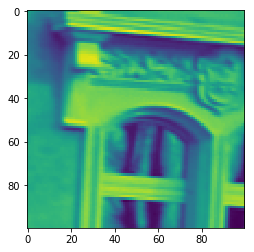

 #### Transformed ####


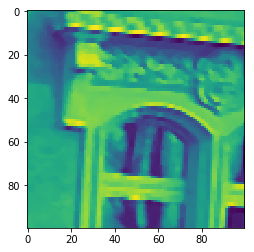

 Iteration :  7  ,  2
 #### Original ####


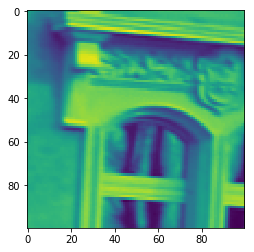

 #### Transformed ####


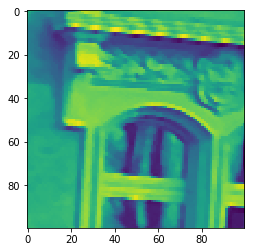

 Iteration :  7  ,  3
 #### Original ####


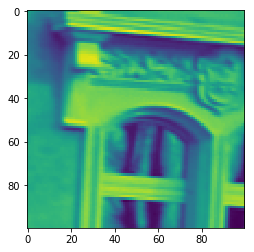

 #### Transformed ####


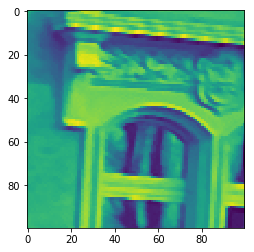

 Iteration :  7  ,  4
 #### Original ####


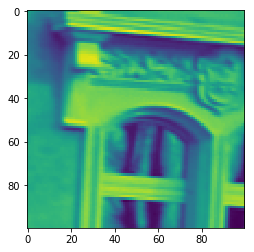

 #### Transformed ####


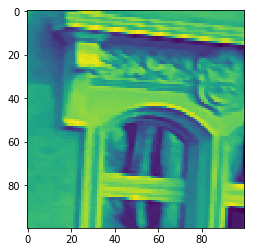

 Iteration :  7  ,  5
 #### Original ####


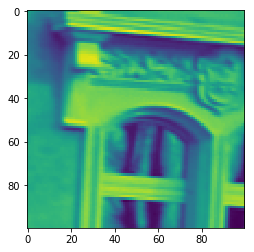

 #### Transformed ####


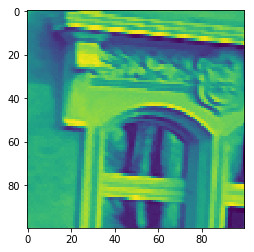

 Iteration :  7  ,  6
 #### Original ####


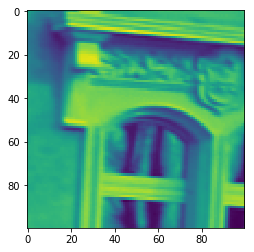

 #### Transformed ####


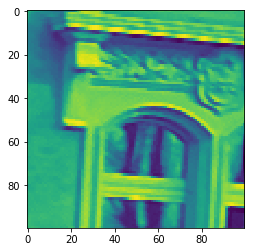

 Iteration :  7  ,  7
 #### Original ####


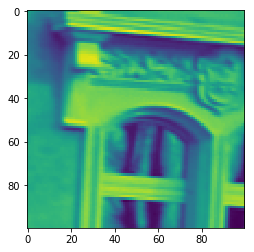

 #### Transformed ####


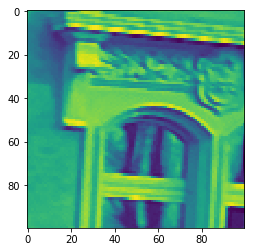

 Iteration :  7  ,  8
 #### Original ####


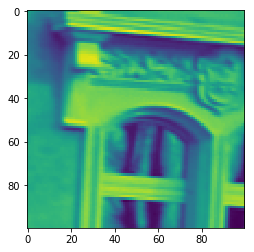

 #### Transformed ####


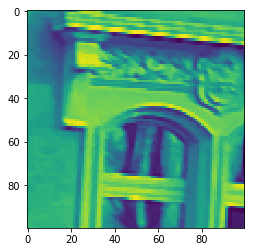

 Iteration :  7  ,  9
 #### Original ####


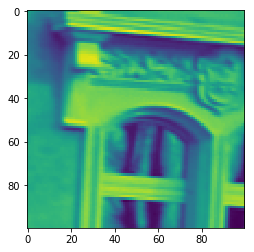

 #### Transformed ####


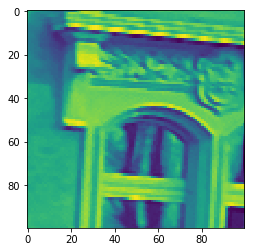

 Iteration :  8  ,  1
 #### Original ####


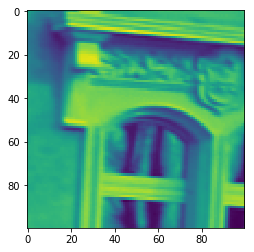

 #### Transformed ####


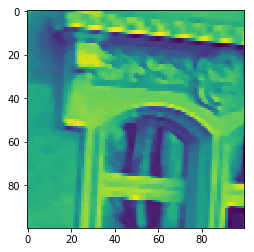

 Iteration :  8  ,  2
 #### Original ####


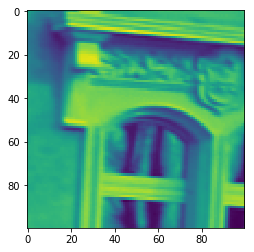

 #### Transformed ####


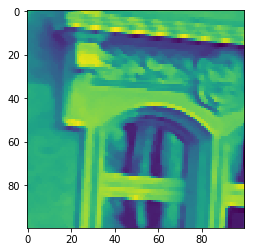

 Iteration :  8  ,  3
 #### Original ####


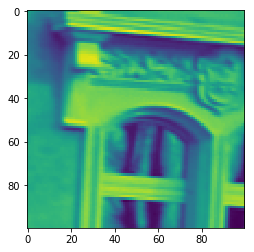

 #### Transformed ####


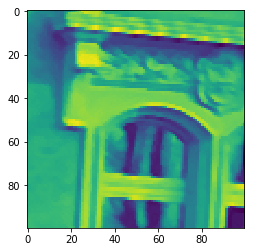

 Iteration :  8  ,  4
 #### Original ####


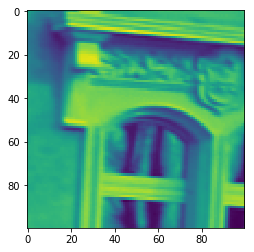

 #### Transformed ####


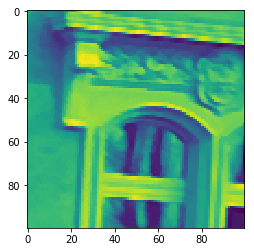

 Iteration :  8  ,  5
 #### Original ####


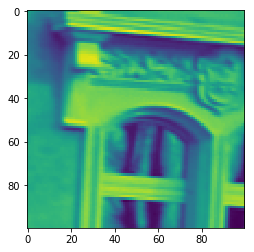

 #### Transformed ####


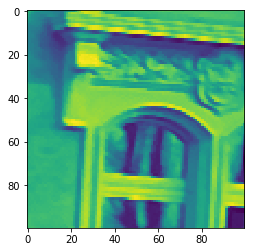

 Iteration :  8  ,  6
 #### Original ####


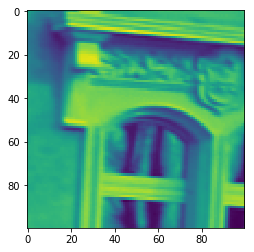

 #### Transformed ####


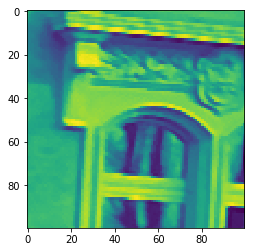

 Iteration :  8  ,  7
 #### Original ####


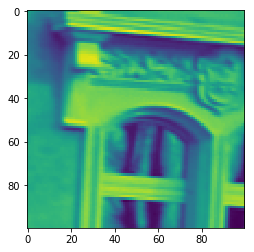

 #### Transformed ####


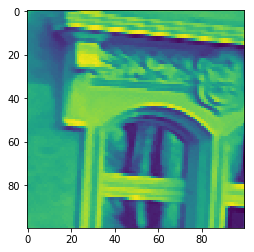

 Iteration :  8  ,  8
 #### Original ####


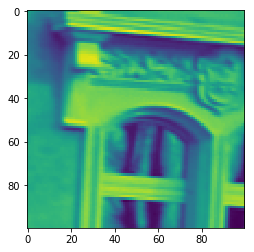

 #### Transformed ####


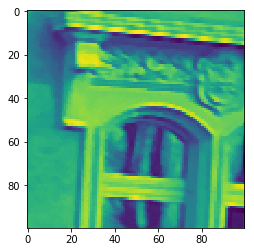

 Iteration :  8  ,  9
 #### Original ####


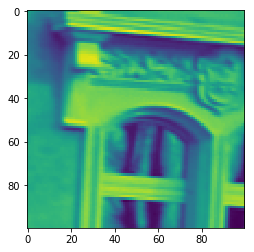

 #### Transformed ####


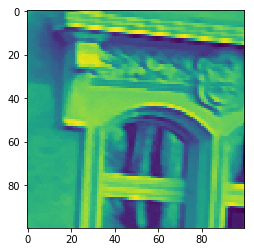

 Iteration :  9  ,  1
 #### Original ####


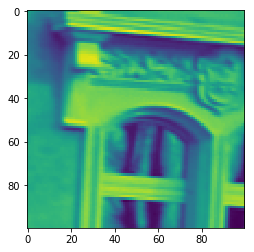

 #### Transformed ####


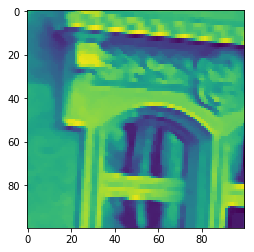

 Iteration :  9  ,  2
 #### Original ####


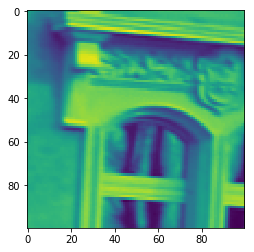

 #### Transformed ####


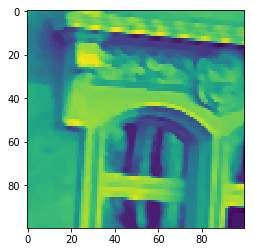

 Iteration :  9  ,  3
 #### Original ####


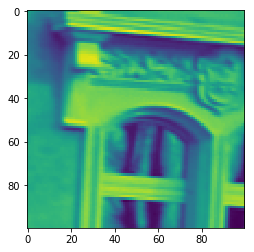

 #### Transformed ####


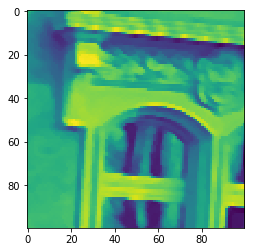

 Iteration :  9  ,  4
 #### Original ####


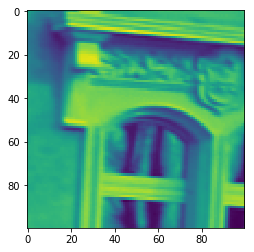

 #### Transformed ####


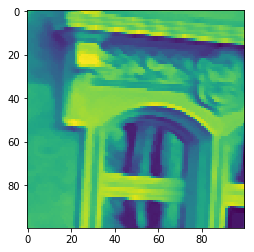

 Iteration :  9  ,  5
 #### Original ####


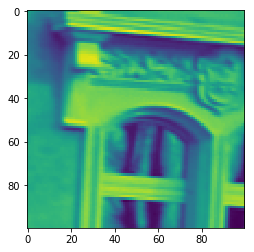

 #### Transformed ####


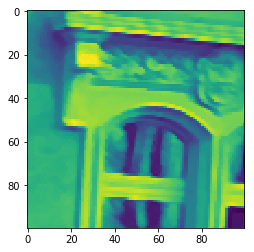

 Iteration :  9  ,  6
 #### Original ####


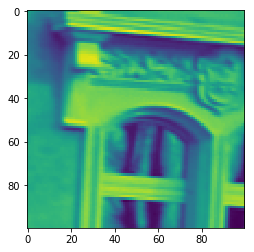

 #### Transformed ####


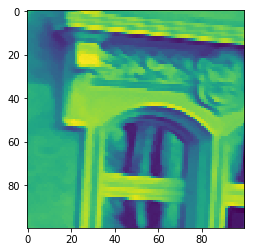

 Iteration :  9  ,  7
 #### Original ####


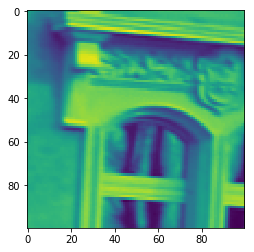

 #### Transformed ####


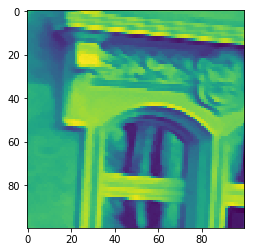

 Iteration :  9  ,  8
 #### Original ####


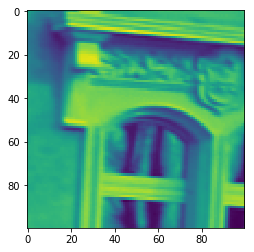

 #### Transformed ####


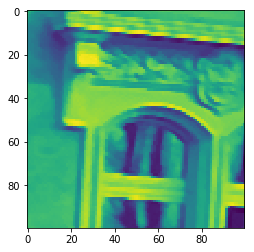

 Iteration :  9  ,  9
 #### Original ####


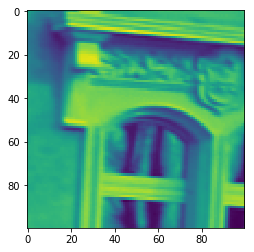

 #### Transformed ####


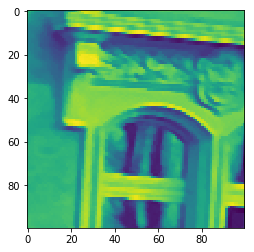

In [30]:
Q = {}
img_path = "data/train/enhanced/10.jpg"
original_image = cv2.imread(img_path, 0)
original_image1 = cv2.imread(img_path, 0)
image = cv2.imread(img_path, 0)

for i in range(1,10):
    for j in range(1,10):
        
        median = 0.1 * i
        sharp  = 0.1 * j
        image = median*get_new_state(original_image, "m") + sharp*get_new_state(original_image, "s")
#         print(original_image1 == original_image)
        print(" Iteration : ", i, " , ", j)
        print(" #### Original ####")
        plt.imshow(original_image1)
        plt.show()
        
        print(" #### Transformed ####")
        plt.imshow(image)
        plt.show()
        
#         reward = float(input(" Enter reward : "))
        reward = 1
        img_tuple = (tuple(x) for x in image)
        Q[img_tuple] = [(i,j), reward]

(63, 20000)
 iteration :  1   1
 reward :  1
(100, 100)
(64, 20000)


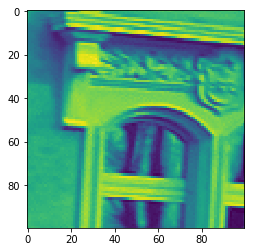

 iteration :  1   2
 reward :  1


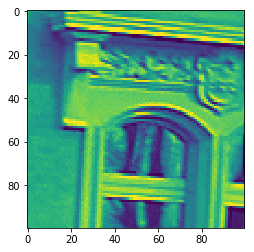

 iteration :  1   3
 reward :  1


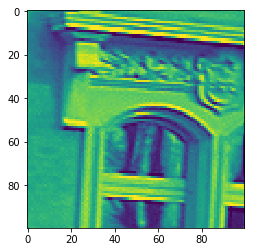

 iteration :  1   4
 reward :  1


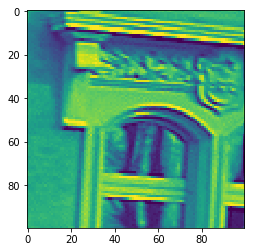

 iteration :  1   5
 reward :  1


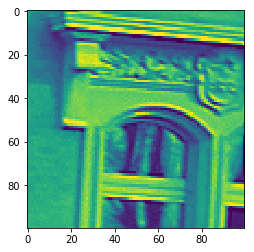

 iteration :  1   6
 reward :  1


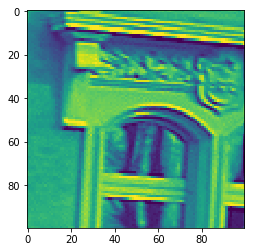

 iteration :  1   7
 reward :  1


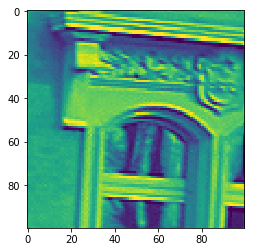

 iteration :  1   8
 reward :  1


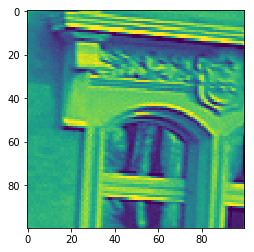

 iteration :  1   9
 reward :  1


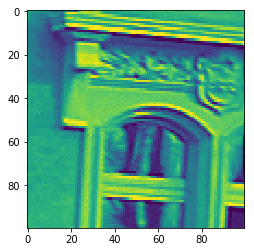

 iteration :  2   1
 reward :  1
(100, 100)
(65, 20000)


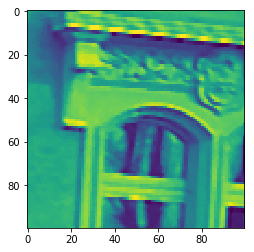

 iteration :  2   2
 reward :  1


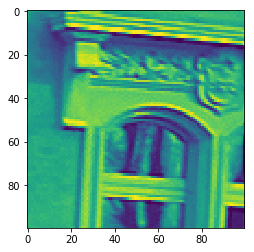

 iteration :  2   3
 reward :  1


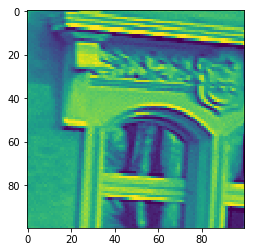

 iteration :  2   4
 reward :  1


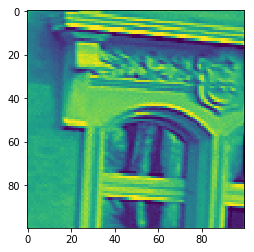

 iteration :  2   5
 reward :  1


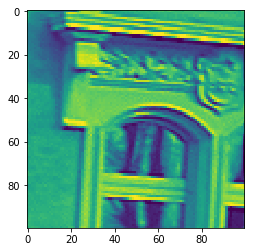

 iteration :  2   6
 reward :  1


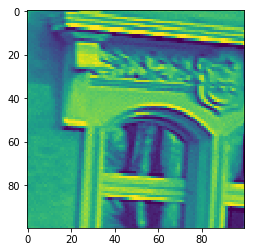

 iteration :  2   7
 reward :  1


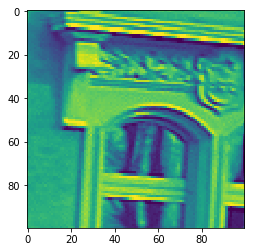

 iteration :  2   8
 reward :  1


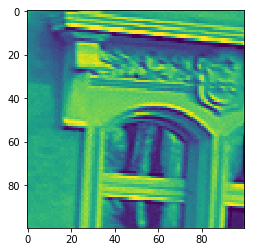

 iteration :  2   9
 reward :  1
(100, 100)
(66, 20000)


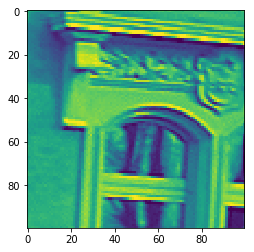

 iteration :  3   1
 reward :  1
(100, 100)
(67, 20000)


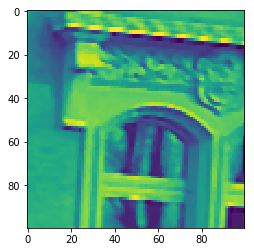

 iteration :  3   2
 reward :  1


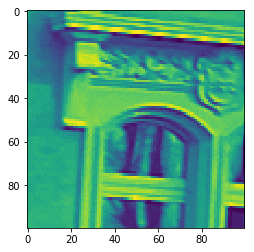

 iteration :  3   3
 reward :  1


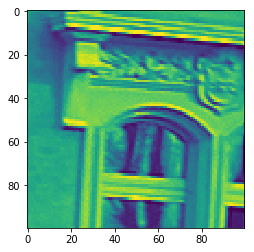

 iteration :  3   4
 reward :  1


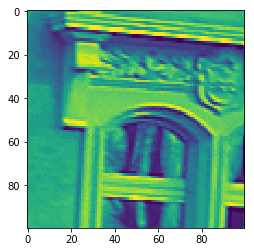

 iteration :  3   5
 reward :  1


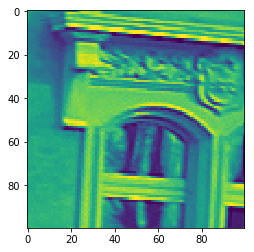

 iteration :  3   6
 reward :  1


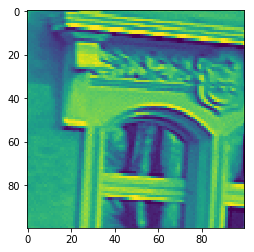

 iteration :  3   7
 reward :  1
(100, 100)
(68, 20000)


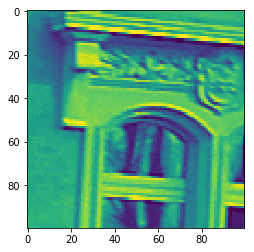

 iteration :  3   8
 reward :  1


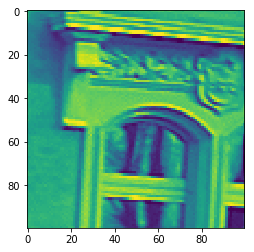

 iteration :  3   9
 reward :  1


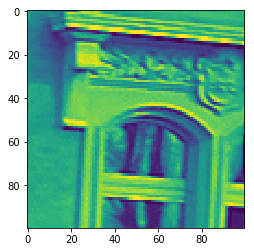

 iteration :  4   1
 reward :  1
(100, 100)
(69, 20000)


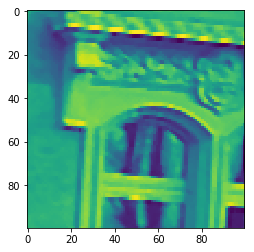

 iteration :  4   2
 reward :  1
(100, 100)
(70, 20000)


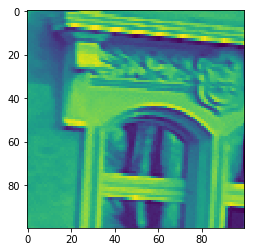

 iteration :  4   3
 reward :  1


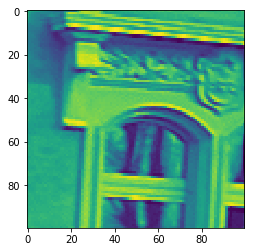

 iteration :  4   4
 reward :  1
(100, 100)
(71, 20000)


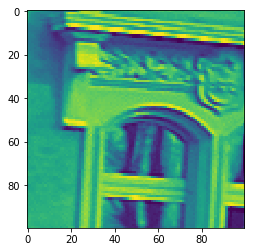

 iteration :  4   5
 reward :  1
(100, 100)
(72, 20000)


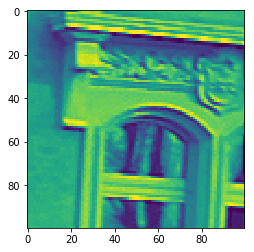

 iteration :  4   6
 reward :  1


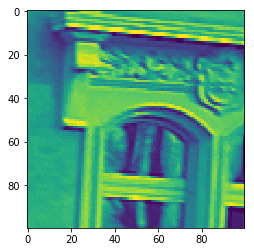

 iteration :  4   7
 reward :  1


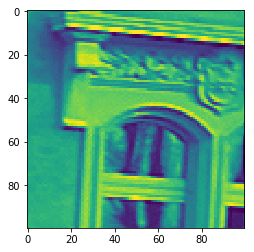

 iteration :  4   8
 reward :  1


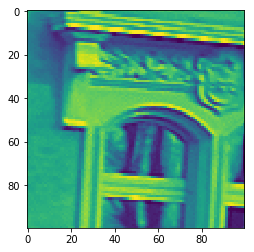

 iteration :  4   9
 reward :  1


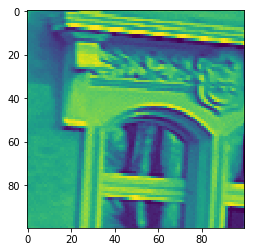

 iteration :  5   1
 reward :  1
(100, 100)
(73, 20000)


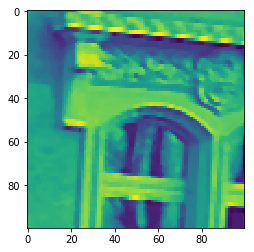

 iteration :  5   2
 reward :  1


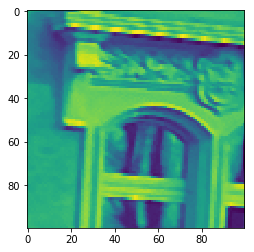

 iteration :  5   3
 reward :  1


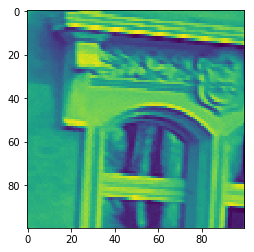

 iteration :  5   4
 reward :  1


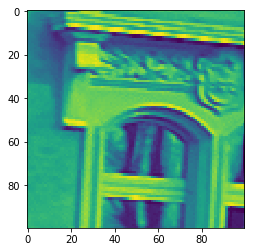

 iteration :  5   5
 reward :  1


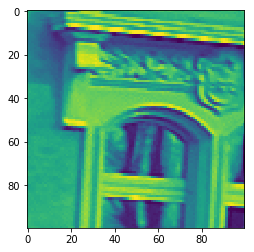

 iteration :  5   6
 reward :  1
(100, 100)
(74, 20000)


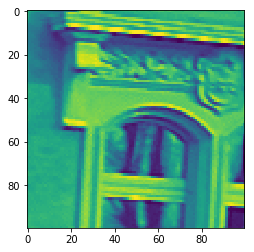

 iteration :  5   7
 reward :  1
(100, 100)
(75, 20000)


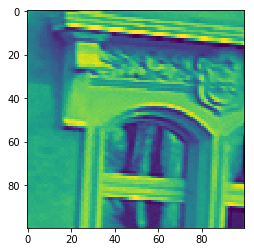

 iteration :  5   8
 reward :  1


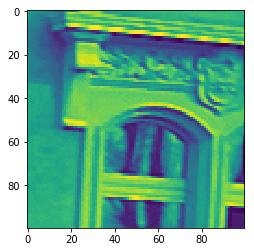

 iteration :  5   9
 reward :  1


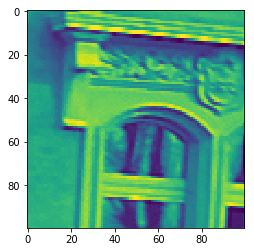

 iteration :  6   1
 reward :  1


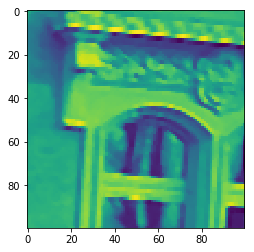

 iteration :  6   2
 reward :  1


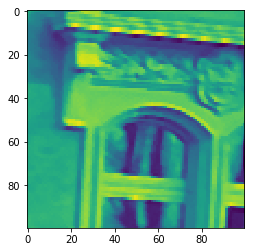

 iteration :  6   3
 reward :  1


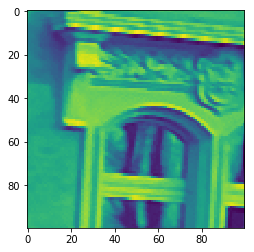

 iteration :  6   4
 reward :  1


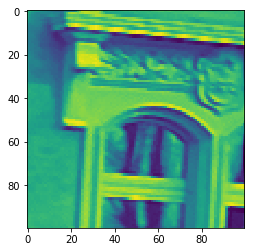

 iteration :  6   5
 reward :  1
(100, 100)
(76, 20000)


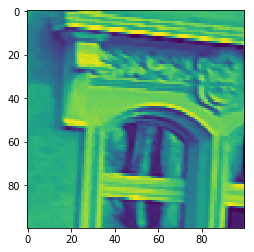

 iteration :  6   6
 reward :  1


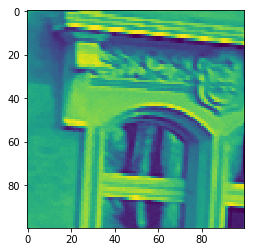

 iteration :  6   7
 reward :  1


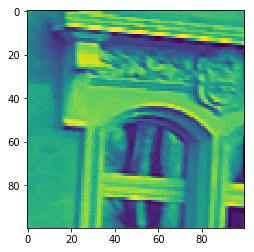

 iteration :  6   8
 reward :  1


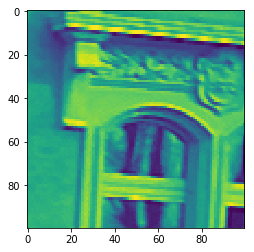

 iteration :  6   9
 reward :  1
(100, 100)
(77, 20000)


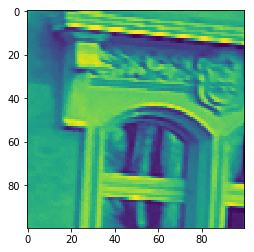

 iteration :  7   1
 reward :  1


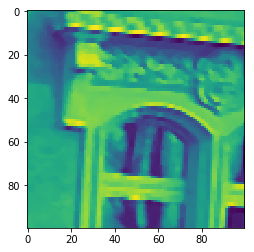

 iteration :  7   2
 reward :  1


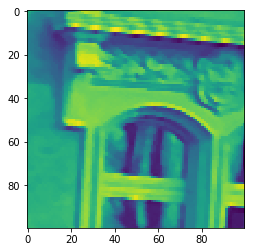

 iteration :  7   3
 reward :  1


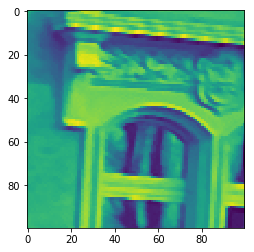

 iteration :  7   4
 reward :  1


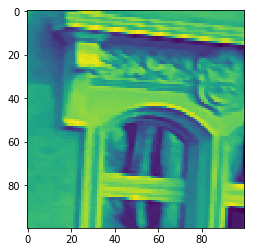

 iteration :  7   5
 reward :  1
(100, 100)
(78, 20000)


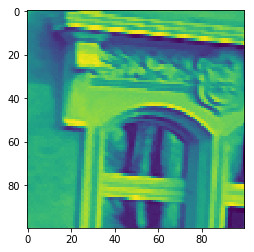

 iteration :  7   6
 reward :  1


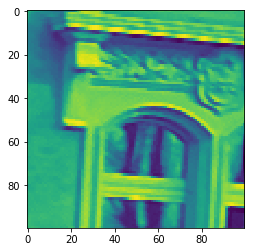

 iteration :  7   7
 reward :  1


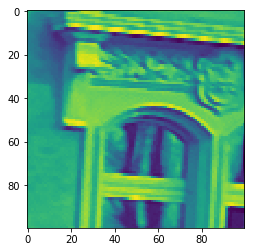

 iteration :  7   8
 reward :  1


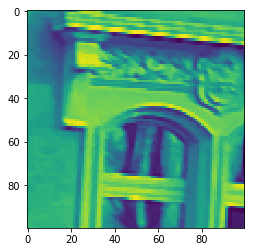

 iteration :  7   9
 reward :  1
(100, 100)
(79, 20000)


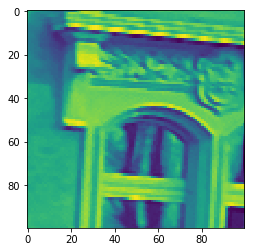

 iteration :  8   1
 reward :  1


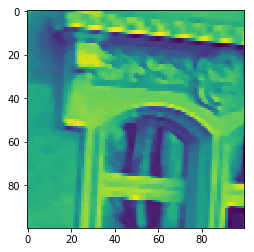

 iteration :  8   2
 reward :  1


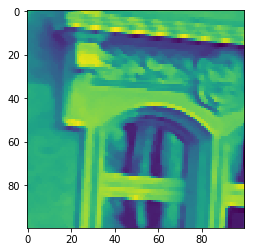

 iteration :  8   3
 reward :  1
(100, 100)
(80, 20000)


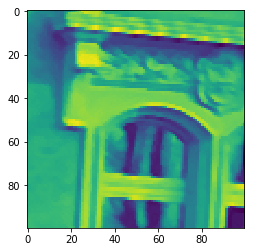

 iteration :  8   4
 reward :  1


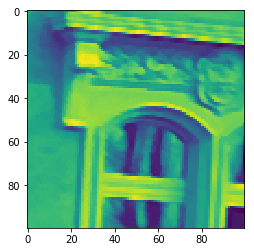

 iteration :  8   5
 reward :  1


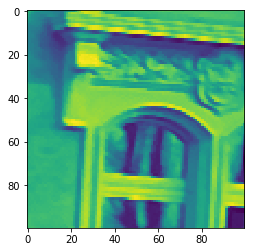

 iteration :  8   6
 reward :  1
(100, 100)
(81, 20000)


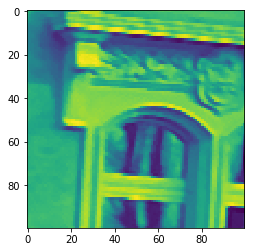

 iteration :  8   7
 reward :  1


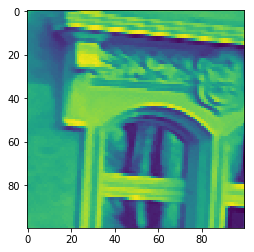

 iteration :  8   8
 reward :  1


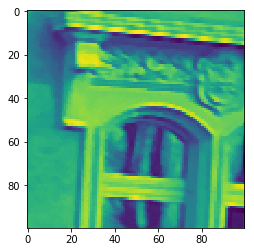

 iteration :  8   9
 reward :  1


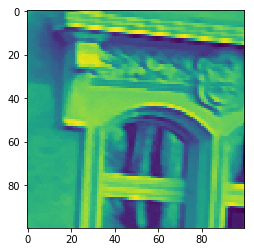

 iteration :  9   1
 reward :  1
(100, 100)
(82, 20000)


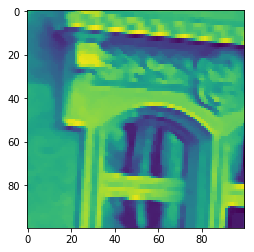

 iteration :  9   2
 reward :  1
(100, 100)
(83, 20000)


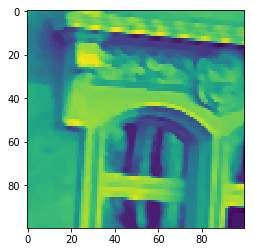

 iteration :  9   3
 reward :  1
(100, 100)
(84, 20000)


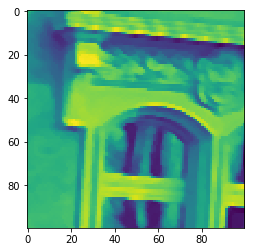

 iteration :  9   4
 reward :  1
(100, 100)
(85, 20000)


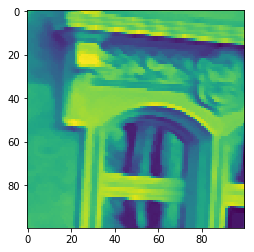

 iteration :  9   5
 reward :  1
(100, 100)
(86, 20000)


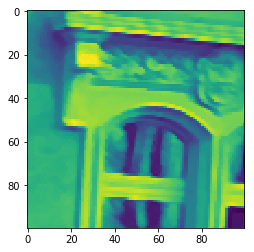

 iteration :  9   6
 reward :  1
(100, 100)
(87, 20000)


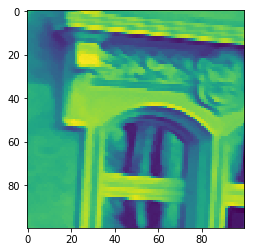

 iteration :  9   7
 reward :  1
(100, 100)
(88, 20000)


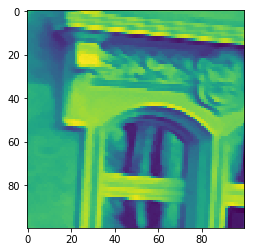

 iteration :  9   8
 reward :  1
(100, 100)
(89, 20000)


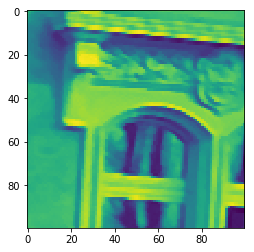

 iteration :  9   9
 reward :  1
(100, 100)
(90, 20000)


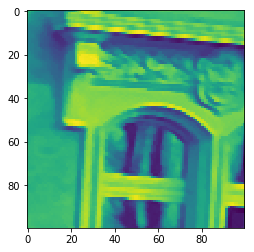

In [31]:
falses = [[9,9], [9,8], [9,7], [9,6], [9,5], [9,4], [9,3], [9,2], [9,1], [8,6], [8,3], [7,9], [7,5], [6,9], [6,5], [5,7], [5,1], [4,2], [4,1], [3,1], [2,1],[1,1]]
enhanced = [[4,5],[4,4],[5,6],[2,9],[3,7]]
false_imgs = []
def print_Q_table(Q, x, y, ret=False):
    for k in Q:
        print(" iteration : ",Q[k][0][0], " ", Q[k][0][1])
        print(" reward : ", Q[k][1])

        img = np.array([np.array(list(x)) for x in k])
        if list(Q[k][0]) in falses:
            print(np.shape(img))
            x=np.append(x,np.reshape([original_image1, img], [1,20000]), axis=0)
            print(np.shape(x))
            y=np.append(y,np.array([np.array([0.,1.])]), axis=0)
        elif list(Q[k][0]) in enhanced:
            print(np.shape(img))
            x=np.append(x,np.reshape([original_image1, img], [1,20000]), axis=0)
            print(np.shape(x))
            y=np.append(y,np.array([np.array([0.,1.])]), axis=0)
            
        plt.imshow(img)
        plt.show()
    if ret:
        return x,y

print(np.shape(x))
x, y = print_Q_table(Q, x, y, True)

In [33]:
model = DNN()
for i in range(len(x)):
    x[i] = normalize([x[i]])[0]

np.random.shuffle(x)
model.train(x, y, 5000)


Epoch 1/5000
90/90 [==============================] - 0s - loss: 0.6900 - acc: 0.6444     
Epoch 2/5000
90/90 [==============================] - 0s - loss: 0.6791 - acc: 0.7000     
Epoch 3/5000
90/90 [==============================] - 0s - loss: 0.6694 - acc: 0.7000     
Epoch 4/5000
90/90 [==============================] - 0s - loss: 0.6610 - acc: 0.7000     
Epoch 5/5000
90/90 [==============================] - 0s - loss: 0.6539 - acc: 0.7000     
Epoch 6/5000
90/90 [==============================] - 0s - loss: 0.6473 - acc: 0.7000     
Epoch 7/5000
90/90 [==============================] - 0s - loss: 0.6422 - acc: 0.7000     
Epoch 8/5000
90/90 [==============================] - 0s - loss: 0.6374 - acc: 0.7000     
Epoch 9/5000
90/90 [==============================] - 0s - loss: 0.6335 - acc: 0.7000     
Epoch 10/5000
90/90 [==============================] - 0s - loss: 0.6298 - acc: 0.7000     
Epoch 11/5000
90/90 [==============================] - 0s - loss: 0.6268 - acc: 0.7000   

90/90 [==============================] - 0s - loss: 0.6102 - acc: 0.7000     
Epoch 91/5000
90/90 [==============================] - 0s - loss: 0.6099 - acc: 0.7000     
Epoch 92/5000
90/90 [==============================] - 0s - loss: 0.6099 - acc: 0.7000     
Epoch 93/5000
90/90 [==============================] - 0s - loss: 0.6099 - acc: 0.7000     
Epoch 94/5000
90/90 [==============================] - 0s - loss: 0.6102 - acc: 0.7000     
Epoch 95/5000
90/90 [==============================] - 0s - loss: 0.6098 - acc: 0.7000     
Epoch 96/5000
90/90 [==============================] - 0s - loss: 0.6106 - acc: 0.7000     
Epoch 97/5000
90/90 [==============================] - 0s - loss: 0.6112 - acc: 0.7000     
Epoch 98/5000
90/90 [==============================] - 0s - loss: 0.6099 - acc: 0.7000     
Epoch 99/5000
90/90 [==============================] - 0s - loss: 0.6098 - acc: 0.7000     
Epoch 100/5000
90/90 [==============================] - 0s - loss: 0.6102 - acc: 0.7000     
E

90/90 [==============================] - 0s - loss: 0.6090 - acc: 0.7000     
Epoch 179/5000
90/90 [==============================] - 0s - loss: 0.6089 - acc: 0.7000     
Epoch 180/5000
90/90 [==============================] - 0s - loss: 0.6093 - acc: 0.7000     
Epoch 181/5000
90/90 [==============================] - 0s - loss: 0.6088 - acc: 0.7000     
Epoch 182/5000
90/90 [==============================] - 0s - loss: 0.6090 - acc: 0.7000     
Epoch 183/5000
90/90 [==============================] - 0s - loss: 0.6088 - acc: 0.7000     
Epoch 184/5000
90/90 [==============================] - 0s - loss: 0.6090 - acc: 0.7000     
Epoch 185/5000
90/90 [==============================] - 0s - loss: 0.6088 - acc: 0.7000     
Epoch 186/5000
90/90 [==============================] - 0s - loss: 0.6089 - acc: 0.7000     
Epoch 187/5000
90/90 [==============================] - 0s - loss: 0.6091 - acc: 0.7000     
Epoch 188/5000
90/90 [==============================] - 0s - loss: 0.6090 - acc: 0.70

90/90 [==============================] - 0s - loss: 0.6082 - acc: 0.7000     
Epoch 267/5000
90/90 [==============================] - 0s - loss: 0.6074 - acc: 0.7000     
Epoch 268/5000
90/90 [==============================] - 0s - loss: 0.6074 - acc: 0.7000     
Epoch 269/5000
90/90 [==============================] - 0s - loss: 0.6080 - acc: 0.7000     
Epoch 270/5000
90/90 [==============================] - 0s - loss: 0.6073 - acc: 0.7000     
Epoch 271/5000
90/90 [==============================] - 0s - loss: 0.6075 - acc: 0.7000     
Epoch 272/5000
90/90 [==============================] - 0s - loss: 0.6076 - acc: 0.7000     
Epoch 273/5000
90/90 [==============================] - 0s - loss: 0.6078 - acc: 0.7000     
Epoch 274/5000
90/90 [==============================] - 0s - loss: 0.6078 - acc: 0.7000     
Epoch 275/5000
90/90 [==============================] - 0s - loss: 0.6080 - acc: 0.7000     
Epoch 276/5000
90/90 [==============================] - 0s - loss: 0.6077 - acc: 0.70

90/90 [==============================] - 0s - loss: 0.6050 - acc: 0.7000     
Epoch 355/5000
90/90 [==============================] - 0s - loss: 0.6054 - acc: 0.7000     
Epoch 356/5000
90/90 [==============================] - 0s - loss: 0.6052 - acc: 0.7000     
Epoch 357/5000
90/90 [==============================] - 0s - loss: 0.6065 - acc: 0.7000     
Epoch 358/5000
90/90 [==============================] - 0s - loss: 0.6050 - acc: 0.7000     
Epoch 359/5000
90/90 [==============================] - 0s - loss: 0.6057 - acc: 0.7000     
Epoch 360/5000
90/90 [==============================] - 0s - loss: 0.6048 - acc: 0.7000     
Epoch 361/5000
90/90 [==============================] - 0s - loss: 0.6050 - acc: 0.7000     
Epoch 362/5000
90/90 [==============================] - 0s - loss: 0.6047 - acc: 0.7000     
Epoch 363/5000
90/90 [==============================] - 0s - loss: 0.6046 - acc: 0.7000     
Epoch 364/5000
90/90 [==============================] - 0s - loss: 0.6051 - acc: 0.70

90/90 [==============================] - 0s - loss: 0.6004 - acc: 0.7000     
Epoch 443/5000
90/90 [==============================] - 0s - loss: 0.6001 - acc: 0.7000     
Epoch 444/5000
90/90 [==============================] - 0s - loss: 0.6005 - acc: 0.7000     
Epoch 445/5000
90/90 [==============================] - 0s - loss: 0.6005 - acc: 0.7000     
Epoch 446/5000
90/90 [==============================] - 0s - loss: 0.6008 - acc: 0.7000     
Epoch 447/5000
90/90 [==============================] - 0s - loss: 0.6007 - acc: 0.7000     
Epoch 448/5000
90/90 [==============================] - 0s - loss: 0.6011 - acc: 0.7000     
Epoch 449/5000
90/90 [==============================] - 0s - loss: 0.6000 - acc: 0.7000     
Epoch 450/5000
90/90 [==============================] - 0s - loss: 0.6011 - acc: 0.7000     
Epoch 451/5000
90/90 [==============================] - 0s - loss: 0.6013 - acc: 0.7000     
Epoch 452/5000
90/90 [==============================] - 0s - loss: 0.6010 - acc: 0.70

90/90 [==============================] - 0s - loss: 0.5910 - acc: 0.7000     
Epoch 531/5000
90/90 [==============================] - 0s - loss: 0.5906 - acc: 0.7000     
Epoch 532/5000
90/90 [==============================] - 0s - loss: 0.5901 - acc: 0.7000     
Epoch 533/5000
90/90 [==============================] - 0s - loss: 0.5919 - acc: 0.7000     
Epoch 534/5000
90/90 [==============================] - 0s - loss: 0.5902 - acc: 0.7000     
Epoch 535/5000
90/90 [==============================] - 0s - loss: 0.5914 - acc: 0.7000     
Epoch 536/5000
90/90 [==============================] - 0s - loss: 0.5899 - acc: 0.7000     
Epoch 537/5000
90/90 [==============================] - 0s - loss: 0.5913 - acc: 0.7000     
Epoch 538/5000
90/90 [==============================] - 0s - loss: 0.5894 - acc: 0.7000     
Epoch 539/5000
90/90 [==============================] - 0s - loss: 0.5894 - acc: 0.7000     
Epoch 540/5000
90/90 [==============================] - 0s - loss: 0.5897 - acc: 0.70

90/90 [==============================] - 0s - loss: 0.5752 - acc: 0.7000     
Epoch 618/5000
90/90 [==============================] - 0s - loss: 0.5760 - acc: 0.7000     
Epoch 619/5000
90/90 [==============================] - 0s - loss: 0.5766 - acc: 0.7000     
Epoch 620/5000
90/90 [==============================] - 0s - loss: 0.5724 - acc: 0.7000     
Epoch 621/5000
90/90 [==============================] - 0s - loss: 0.5727 - acc: 0.7000     
Epoch 622/5000
90/90 [==============================] - 0s - loss: 0.5726 - acc: 0.7000     
Epoch 623/5000
90/90 [==============================] - 0s - loss: 0.5716 - acc: 0.7000     
Epoch 624/5000
90/90 [==============================] - 0s - loss: 0.5726 - acc: 0.7000     
Epoch 625/5000
90/90 [==============================] - 0s - loss: 0.5741 - acc: 0.7000     
Epoch 626/5000
90/90 [==============================] - 0s - loss: 0.5737 - acc: 0.7000     
Epoch 627/5000
90/90 [==============================] - 0s - loss: 0.5732 - acc: 0.70

90/90 [==============================] - 0s - loss: 0.5535 - acc: 0.7000     
Epoch 706/5000
90/90 [==============================] - 0s - loss: 0.5392 - acc: 0.7000     
Epoch 707/5000
90/90 [==============================] - 0s - loss: 0.5417 - acc: 0.7000     
Epoch 708/5000
90/90 [==============================] - 0s - loss: 0.5423 - acc: 0.7000     
Epoch 709/5000
90/90 [==============================] - 0s - loss: 0.5358 - acc: 0.7000     
Epoch 710/5000
90/90 [==============================] - 0s - loss: 0.5527 - acc: 0.7000     
Epoch 711/5000
90/90 [==============================] - 0s - loss: 0.5339 - acc: 0.7000     
Epoch 712/5000
90/90 [==============================] - 0s - loss: 0.5384 - acc: 0.7000     
Epoch 713/5000
90/90 [==============================] - 0s - loss: 0.5369 - acc: 0.7000     
Epoch 714/5000
90/90 [==============================] - 0s - loss: 0.5370 - acc: 0.7000     
Epoch 715/5000
90/90 [==============================] - 0s - loss: 0.5397 - acc: 0.70

90/90 [==============================] - 0s - loss: 0.4785 - acc: 0.8111     
Epoch 793/5000
90/90 [==============================] - 0s - loss: 0.4819 - acc: 0.8222     
Epoch 794/5000
90/90 [==============================] - 0s - loss: 0.4964 - acc: 0.7444     
Epoch 795/5000
90/90 [==============================] - 0s - loss: 0.4708 - acc: 0.8333     
Epoch 796/5000
90/90 [==============================] - 0s - loss: 0.4949 - acc: 0.7778     
Epoch 797/5000
90/90 [==============================] - 0s - loss: 0.4631 - acc: 0.8222     
Epoch 798/5000
90/90 [==============================] - 0s - loss: 0.4876 - acc: 0.8222     
Epoch 799/5000
90/90 [==============================] - 0s - loss: 0.4924 - acc: 0.7444     
Epoch 800/5000
90/90 [==============================] - 0s - loss: 0.4918 - acc: 0.7667     
Epoch 801/5000
90/90 [==============================] - 0s - loss: 0.4579 - acc: 0.8444     
Epoch 802/5000
90/90 [==============================] - 0s - loss: 0.4591 - acc: 0.81

90/90 [==============================] - 0s - loss: 0.4388 - acc: 0.8444     
Epoch 881/5000
90/90 [==============================] - 0s - loss: 0.4265 - acc: 0.8333     
Epoch 882/5000
90/90 [==============================] - 0s - loss: 0.5916 - acc: 0.6556     
Epoch 883/5000
90/90 [==============================] - 0s - loss: 0.5134 - acc: 0.7222     
Epoch 884/5000
90/90 [==============================] - 0s - loss: 0.3969 - acc: 0.8667     
Epoch 885/5000
90/90 [==============================] - 0s - loss: 0.4459 - acc: 0.8556     
Epoch 886/5000
90/90 [==============================] - 0s - loss: 0.4935 - acc: 0.7778     
Epoch 887/5000
90/90 [==============================] - 0s - loss: 0.5200 - acc: 0.7333     
Epoch 888/5000
90/90 [==============================] - 0s - loss: 0.4410 - acc: 0.8333     
Epoch 889/5000
90/90 [==============================] - 0s - loss: 0.3953 - acc: 0.8556     
Epoch 890/5000
90/90 [==============================] - 0s - loss: 0.3865 - acc: 0.88

90/90 [==============================] - 0s - loss: 0.3605 - acc: 0.8667     
Epoch 968/5000
90/90 [==============================] - 0s - loss: 0.6481 - acc: 0.6778     
Epoch 969/5000
90/90 [==============================] - 0s - loss: 0.5438 - acc: 0.7667     
Epoch 970/5000
90/90 [==============================] - 0s - loss: 0.4210 - acc: 0.8444     
Epoch 971/5000
90/90 [==============================] - 0s - loss: 0.3558 - acc: 0.9000     
Epoch 972/5000
90/90 [==============================] - 0s - loss: 0.5085 - acc: 0.7333     
Epoch 973/5000
90/90 [==============================] - 0s - loss: 0.3614 - acc: 0.8667     
Epoch 974/5000
90/90 [==============================] - 0s - loss: 0.3509 - acc: 0.8889     
Epoch 975/5000
90/90 [==============================] - 0s - loss: 0.3468 - acc: 0.8889     
Epoch 976/5000
90/90 [==============================] - 0s - loss: 0.3301 - acc: 0.9111     
Epoch 977/5000
90/90 [==============================] - 0s - loss: 0.3351 - acc: 0.91

90/90 [==============================] - 0s - loss: 0.7867 - acc: 0.7000     
Epoch 1055/5000
90/90 [==============================] - 0s - loss: 0.4640 - acc: 0.7889     
Epoch 1056/5000
90/90 [==============================] - 0s - loss: 0.3568 - acc: 0.9111     
Epoch 1057/5000
90/90 [==============================] - 0s - loss: 0.3581 - acc: 0.8556     
Epoch 1058/5000
90/90 [==============================] - 0s - loss: 0.3918 - acc: 0.8333     
Epoch 1059/5000
90/90 [==============================] - 0s - loss: 0.4250 - acc: 0.8111     
Epoch 1060/5000
90/90 [==============================] - 0s - loss: 0.3130 - acc: 0.8889     
Epoch 1061/5000
90/90 [==============================] - 0s - loss: 0.3062 - acc: 0.8778     
Epoch 1062/5000
90/90 [==============================] - 0s - loss: 0.2955 - acc: 0.9111     
Epoch 1063/5000
90/90 [==============================] - 0s - loss: 0.6333 - acc: 0.6778     
Epoch 1064/5000
90/90 [==============================] - 0s - loss: 0.3450 -

90/90 [==============================] - 0s - loss: 0.4576 - acc: 0.7889     
Epoch 1142/5000
90/90 [==============================] - 0s - loss: 0.3594 - acc: 0.8444     
Epoch 1143/5000
90/90 [==============================] - 0s - loss: 0.2683 - acc: 0.9000     
Epoch 1144/5000
90/90 [==============================] - 0s - loss: 0.2831 - acc: 0.9000     
Epoch 1145/5000
90/90 [==============================] - 0s - loss: 0.3189 - acc: 0.8889     
Epoch 1146/5000
90/90 [==============================] - 0s - loss: 0.4494 - acc: 0.8222     
Epoch 1147/5000
90/90 [==============================] - 0s - loss: 0.2493 - acc: 0.9111     
Epoch 1148/5000
90/90 [==============================] - 0s - loss: 0.2546 - acc: 0.9111     
Epoch 1149/5000
90/90 [==============================] - 0s - loss: 0.3716 - acc: 0.8667     
Epoch 1150/5000
90/90 [==============================] - 0s - loss: 0.5395 - acc: 0.7889     
Epoch 1151/5000
90/90 [==============================] - 0s - loss: 0.4416 -

90/90 [==============================] - 0s - loss: 0.5226 - acc: 0.7444     
Epoch 1229/5000
90/90 [==============================] - 0s - loss: 0.2811 - acc: 0.9000     
Epoch 1230/5000
90/90 [==============================] - 0s - loss: 0.2776 - acc: 0.8889     
Epoch 1231/5000
90/90 [==============================] - 0s - loss: 0.2303 - acc: 0.9333     
Epoch 1232/5000
90/90 [==============================] - 0s - loss: 0.2718 - acc: 0.9222     
Epoch 1233/5000
90/90 [==============================] - 0s - loss: 0.2427 - acc: 0.9111     
Epoch 1234/5000
90/90 [==============================] - 0s - loss: 0.2547 - acc: 0.8889     
Epoch 1235/5000
90/90 [==============================] - 0s - loss: 0.6893 - acc: 0.7000     
Epoch 1236/5000
90/90 [==============================] - 0s - loss: 0.2473 - acc: 0.9222     
Epoch 1237/5000
90/90 [==============================] - 0s - loss: 0.2460 - acc: 0.9222     
Epoch 1238/5000
90/90 [==============================] - 0s - loss: 0.2480 -

90/90 [==============================] - 0s - loss: 0.2088 - acc: 0.9222     
Epoch 1316/5000
90/90 [==============================] - 0s - loss: 0.5578 - acc: 0.7667     
Epoch 1317/5000
90/90 [==============================] - 0s - loss: 0.3024 - acc: 0.8889     
Epoch 1318/5000
90/90 [==============================] - 0s - loss: 0.2247 - acc: 0.9222     
Epoch 1319/5000
90/90 [==============================] - 0s - loss: 0.4298 - acc: 0.8333     
Epoch 1320/5000
90/90 [==============================] - 0s - loss: 0.3046 - acc: 0.8667     
Epoch 1321/5000
90/90 [==============================] - 0s - loss: 0.8232 - acc: 0.7000     
Epoch 1322/5000
90/90 [==============================] - 0s - loss: 0.3361 - acc: 0.8667     
Epoch 1323/5000
90/90 [==============================] - 0s - loss: 0.3387 - acc: 0.9000     
Epoch 1324/5000
90/90 [==============================] - 0s - loss: 0.2464 - acc: 0.9222     
Epoch 1325/5000
90/90 [==============================] - 0s - loss: 0.2589 -

90/90 [==============================] - 0s - loss: 0.2328 - acc: 0.9000     
Epoch 1402/5000
90/90 [==============================] - 0s - loss: 0.2056 - acc: 0.9222     
Epoch 1403/5000
90/90 [==============================] - 0s - loss: 0.2292 - acc: 0.9000     
Epoch 1404/5000
90/90 [==============================] - 0s - loss: 0.2287 - acc: 0.9000     
Epoch 1405/5000
90/90 [==============================] - 0s - loss: 0.6570 - acc: 0.7667     
Epoch 1406/5000
90/90 [==============================] - 0s - loss: 0.2192 - acc: 0.9333     
Epoch 1407/5000
90/90 [==============================] - 0s - loss: 0.2507 - acc: 0.9000     
Epoch 1408/5000
90/90 [==============================] - 0s - loss: 0.2066 - acc: 0.9222     
Epoch 1409/5000
90/90 [==============================] - 0s - loss: 0.2235 - acc: 0.9000     
Epoch 1410/5000
90/90 [==============================] - 0s - loss: 0.3051 - acc: 0.8667     
Epoch 1411/5000
90/90 [==============================] - 0s - loss: 0.5931 -

90/90 [==============================] - 0s - loss: 0.2210 - acc: 0.9111     
Epoch 1488/5000
90/90 [==============================] - 0s - loss: 0.2039 - acc: 0.9333     
Epoch 1489/5000
90/90 [==============================] - 0s - loss: 0.1921 - acc: 0.9222     
Epoch 1490/5000
90/90 [==============================] - 0s - loss: 0.2360 - acc: 0.9111     
Epoch 1491/5000
90/90 [==============================] - 0s - loss: 0.2473 - acc: 0.9000     
Epoch 1492/5000
90/90 [==============================] - 0s - loss: 0.1761 - acc: 0.9333     
Epoch 1493/5000
90/90 [==============================] - 0s - loss: 0.1791 - acc: 0.9333     
Epoch 1494/5000
90/90 [==============================] - 0s - loss: 0.1811 - acc: 0.9222     - ETA: 0s - loss: 0.1644 - acc: 0.921
Epoch 1495/5000
90/90 [==============================] - 0s - loss: 0.1723 - acc: 0.9333     
Epoch 1496/5000
90/90 [==============================] - 0s - loss: 0.1980 - acc: 0.9444     
Epoch 1497/5000
90/90 [================

90/90 [==============================] - 0s - loss: 0.2153 - acc: 0.8889     
Epoch 1574/5000
90/90 [==============================] - 0s - loss: 0.6682 - acc: 0.7444     
Epoch 1575/5000
90/90 [==============================] - 0s - loss: 0.3176 - acc: 0.8889     
Epoch 1576/5000
90/90 [==============================] - 0s - loss: 0.1893 - acc: 0.9222     
Epoch 1577/5000
90/90 [==============================] - 0s - loss: 0.2111 - acc: 0.9222     
Epoch 1578/5000
90/90 [==============================] - 0s - loss: 0.2136 - acc: 0.9000     
Epoch 1579/5000
90/90 [==============================] - 0s - loss: 0.1974 - acc: 0.9111     
Epoch 1580/5000
90/90 [==============================] - 0s - loss: 0.2187 - acc: 0.9222     
Epoch 1581/5000
90/90 [==============================] - 0s - loss: 0.3024 - acc: 0.8556     
Epoch 1582/5000
90/90 [==============================] - 0s - loss: 0.2243 - acc: 0.8889     
Epoch 1583/5000
90/90 [==============================] - 0s - loss: 0.1805 -

90/90 [==============================] - 0s - loss: 0.1800 - acc: 0.9222     
Epoch 1661/5000
90/90 [==============================] - 0s - loss: 0.1699 - acc: 0.9333     
Epoch 1662/5000
90/90 [==============================] - 0s - loss: 0.2681 - acc: 0.9111     
Epoch 1663/5000
90/90 [==============================] - 0s - loss: 0.1649 - acc: 0.9222     
Epoch 1664/5000
90/90 [==============================] - 0s - loss: 0.1814 - acc: 0.9222     
Epoch 1665/5000
90/90 [==============================] - 0s - loss: 0.3792 - acc: 0.8667     
Epoch 1666/5000
90/90 [==============================] - 0s - loss: 0.2221 - acc: 0.9111     
Epoch 1667/5000
90/90 [==============================] - 0s - loss: 0.1732 - acc: 0.9333     
Epoch 1668/5000
90/90 [==============================] - 0s - loss: 0.1553 - acc: 0.9444     
Epoch 1669/5000
90/90 [==============================] - 0s - loss: 0.2203 - acc: 0.9000     
Epoch 1670/5000
90/90 [==============================] - 0s - loss: 0.1594 -

90/90 [==============================] - 0s - loss: 0.2305 - acc: 0.8667     
Epoch 1748/5000
90/90 [==============================] - 0s - loss: 0.2162 - acc: 0.9222     
Epoch 1749/5000
90/90 [==============================] - 0s - loss: 0.5477 - acc: 0.7778     
Epoch 1750/5000
90/90 [==============================] - 0s - loss: 1.4012 - acc: 0.7000     
Epoch 1751/5000
90/90 [==============================] - 0s - loss: 0.4602 - acc: 0.7889     
Epoch 1752/5000
90/90 [==============================] - 0s - loss: 0.3683 - acc: 0.9111     
Epoch 1753/5000
90/90 [==============================] - 0s - loss: 0.3291 - acc: 0.9000     
Epoch 1754/5000
90/90 [==============================] - 0s - loss: 0.2944 - acc: 0.8889     
Epoch 1755/5000
90/90 [==============================] - 0s - loss: 0.2641 - acc: 0.9333     - ETA: 0s - loss: 0.2922 - acc: 0.921
Epoch 1756/5000
90/90 [==============================] - 0s - loss: 0.2939 - acc: 0.8778     
Epoch 1757/5000
90/90 [================

90/90 [==============================] - 0s - loss: 0.2356 - acc: 0.8778     
Epoch 1834/5000
90/90 [==============================] - 0s - loss: 0.2088 - acc: 0.9000     
Epoch 1835/5000
90/90 [==============================] - 0s - loss: 0.2047 - acc: 0.9111     
Epoch 1836/5000
90/90 [==============================] - 0s - loss: 0.1676 - acc: 0.9333     
Epoch 1837/5000
90/90 [==============================] - 0s - loss: 0.1520 - acc: 0.9444     
Epoch 1838/5000
90/90 [==============================] - 0s - loss: 0.1569 - acc: 0.9333     
Epoch 1839/5000
90/90 [==============================] - 0s - loss: 0.1546 - acc: 0.9333     
Epoch 1840/5000
90/90 [==============================] - 0s - loss: 0.1604 - acc: 0.9222     
Epoch 1841/5000
90/90 [==============================] - 0s - loss: 0.1646 - acc: 0.9000     
Epoch 1842/5000
90/90 [==============================] - 0s - loss: 0.1523 - acc: 0.9333     
Epoch 1843/5000
90/90 [==============================] - 0s - loss: 0.1585 -

90/90 [==============================] - 0s - loss: 0.1465 - acc: 0.9333     
Epoch 1921/5000
90/90 [==============================] - 0s - loss: 0.1486 - acc: 0.9333     
Epoch 1922/5000
90/90 [==============================] - 0s - loss: 0.1646 - acc: 0.9000     
Epoch 1923/5000
90/90 [==============================] - 0s - loss: 0.1804 - acc: 0.9111     
Epoch 1924/5000
90/90 [==============================] - 0s - loss: 0.1608 - acc: 0.9111     
Epoch 1925/5000
90/90 [==============================] - 0s - loss: 0.1594 - acc: 0.9333     
Epoch 1926/5000
90/90 [==============================] - 0s - loss: 0.1653 - acc: 0.9222     
Epoch 1927/5000
90/90 [==============================] - 0s - loss: 0.2038 - acc: 0.9000     
Epoch 1928/5000
90/90 [==============================] - 0s - loss: 0.1926 - acc: 0.9222     
Epoch 1929/5000
90/90 [==============================] - 0s - loss: 0.1436 - acc: 0.9444     
Epoch 1930/5000
90/90 [==============================] - 0s - loss: 0.1435 -

90/90 [==============================] - 0s - loss: 0.2582 - acc: 0.9000     
Epoch 2007/5000
90/90 [==============================] - 0s - loss: 0.2162 - acc: 0.8889     
Epoch 2008/5000
90/90 [==============================] - 0s - loss: 0.1623 - acc: 0.9333     
Epoch 2009/5000
90/90 [==============================] - 0s - loss: 0.1734 - acc: 0.9111     
Epoch 2010/5000
90/90 [==============================] - 0s - loss: 0.1573 - acc: 0.9222     
Epoch 2011/5000
90/90 [==============================] - 0s - loss: 0.1499 - acc: 0.9333     
Epoch 2012/5000
90/90 [==============================] - 0s - loss: 0.1637 - acc: 0.9222     
Epoch 2013/5000
90/90 [==============================] - 0s - loss: 0.1681 - acc: 0.9000     
Epoch 2014/5000
90/90 [==============================] - 0s - loss: 0.1826 - acc: 0.9111     
Epoch 2015/5000
90/90 [==============================] - 0s - loss: 0.1497 - acc: 0.9444     
Epoch 2016/5000
90/90 [==============================] - 0s - loss: 0.1504 -

90/90 [==============================] - 0s - loss: 0.3305 - acc: 0.8889     
Epoch 2093/5000
90/90 [==============================] - 0s - loss: 0.1705 - acc: 0.9222     
Epoch 2094/5000
90/90 [==============================] - 0s - loss: 0.2001 - acc: 0.9111     
Epoch 2095/5000
90/90 [==============================] - 0s - loss: 0.1447 - acc: 0.9333     
Epoch 2096/5000
90/90 [==============================] - 0s - loss: 0.1672 - acc: 0.9333     
Epoch 2097/5000
90/90 [==============================] - 0s - loss: 0.1487 - acc: 0.9333     
Epoch 2098/5000
90/90 [==============================] - 0s - loss: 0.1358 - acc: 0.9333     
Epoch 2099/5000
90/90 [==============================] - 0s - loss: 0.1486 - acc: 0.9111     
Epoch 2100/5000
90/90 [==============================] - 0s - loss: 0.1371 - acc: 0.9444     
Epoch 2101/5000
90/90 [==============================] - 0s - loss: 0.1451 - acc: 0.9333     
Epoch 2102/5000
90/90 [==============================] - 0s - loss: 0.1405 -

90/90 [==============================] - 0s - loss: 0.1667 - acc: 0.9222     
Epoch 2180/5000
90/90 [==============================] - 0s - loss: 0.1436 - acc: 0.9333     
Epoch 2181/5000
90/90 [==============================] - 0s - loss: 0.1438 - acc: 0.9333     
Epoch 2182/5000
90/90 [==============================] - 0s - loss: 0.1561 - acc: 0.9222     
Epoch 2183/5000
90/90 [==============================] - 0s - loss: 0.1780 - acc: 0.9222     
Epoch 2184/5000
90/90 [==============================] - 0s - loss: 0.1717 - acc: 0.9222     
Epoch 2185/5000
90/90 [==============================] - 0s - loss: 0.1404 - acc: 0.9333     
Epoch 2186/5000
90/90 [==============================] - 0s - loss: 0.1395 - acc: 0.9444     
Epoch 2187/5000
90/90 [==============================] - 0s - loss: 0.1474 - acc: 0.9222     
Epoch 2188/5000
90/90 [==============================] - 0s - loss: 0.1729 - acc: 0.9222     
Epoch 2189/5000
90/90 [==============================] - 0s - loss: 0.1514 -

90/90 [==============================] - 0s - loss: 0.1376 - acc: 0.9222     
Epoch 2266/5000
90/90 [==============================] - 0s - loss: 0.1318 - acc: 0.9333     
Epoch 2267/5000
90/90 [==============================] - 0s - loss: 0.1930 - acc: 0.9000     
Epoch 2268/5000
90/90 [==============================] - 0s - loss: 0.1662 - acc: 0.9333     
Epoch 2269/5000
90/90 [==============================] - 0s - loss: 0.1328 - acc: 0.9333     
Epoch 2270/5000
90/90 [==============================] - 0s - loss: 0.1295 - acc: 0.9444     
Epoch 2271/5000
90/90 [==============================] - 0s - loss: 0.1319 - acc: 0.9444     
Epoch 2272/5000
90/90 [==============================] - 0s - loss: 0.2020 - acc: 0.8778     
Epoch 2273/5000
90/90 [==============================] - 0s - loss: 0.1569 - acc: 0.9000     
Epoch 2274/5000
90/90 [==============================] - 0s - loss: 0.1407 - acc: 0.9222     
Epoch 2275/5000
90/90 [==============================] - 0s - loss: 0.1338 -

90/90 [==============================] - 0s - loss: 0.1488 - acc: 0.9333     
Epoch 2352/5000
90/90 [==============================] - 0s - loss: 0.1469 - acc: 0.9222     
Epoch 2353/5000
90/90 [==============================] - 0s - loss: 0.1781 - acc: 0.9111     
Epoch 2354/5000
90/90 [==============================] - 0s - loss: 0.1683 - acc: 0.9222     
Epoch 2355/5000
90/90 [==============================] - 0s - loss: 0.1367 - acc: 0.9333     
Epoch 2356/5000
90/90 [==============================] - 0s - loss: 0.1280 - acc: 0.9444     
Epoch 2357/5000
90/90 [==============================] - 0s - loss: 0.1548 - acc: 0.9333     
Epoch 2358/5000
90/90 [==============================] - 0s - loss: 0.1335 - acc: 0.9444     
Epoch 2359/5000
90/90 [==============================] - 0s - loss: 0.1328 - acc: 0.9333     
Epoch 2360/5000
90/90 [==============================] - 0s - loss: 0.1342 - acc: 0.9444     
Epoch 2361/5000
90/90 [==============================] - 0s - loss: 0.1850 -

90/90 [==============================] - 0s - loss: 0.1346 - acc: 0.9333     
Epoch 2439/5000
90/90 [==============================] - 0s - loss: 0.1377 - acc: 0.9333     
Epoch 2440/5000
90/90 [==============================] - 0s - loss: 0.1511 - acc: 0.9333     
Epoch 2441/5000
90/90 [==============================] - 0s - loss: 0.1443 - acc: 0.9111     
Epoch 2442/5000
90/90 [==============================] - 0s - loss: 0.1579 - acc: 0.9111     
Epoch 2443/5000
90/90 [==============================] - 0s - loss: 0.1426 - acc: 0.9333     
Epoch 2444/5000
90/90 [==============================] - 0s - loss: 0.1985 - acc: 0.9111     
Epoch 2445/5000
90/90 [==============================] - 0s - loss: 0.1481 - acc: 0.9333     
Epoch 2446/5000
90/90 [==============================] - 0s - loss: 0.1953 - acc: 0.8889     
Epoch 2447/5000
90/90 [==============================] - 0s - loss: 1.0521 - acc: 0.7333     
Epoch 2448/5000
90/90 [==============================] - 0s - loss: 0.1804 -

90/90 [==============================] - 0s - loss: 0.2544 - acc: 0.9222     
Epoch 2526/5000
90/90 [==============================] - 0s - loss: 0.2539 - acc: 0.9111     
Epoch 2527/5000
90/90 [==============================] - 0s - loss: 0.2517 - acc: 0.9111     
Epoch 2528/5000
90/90 [==============================] - 0s - loss: 0.2340 - acc: 0.9000     
Epoch 2529/5000
90/90 [==============================] - 0s - loss: 0.2406 - acc: 0.9222     
Epoch 2530/5000
90/90 [==============================] - 0s - loss: 0.2329 - acc: 0.9000     
Epoch 2531/5000
90/90 [==============================] - 0s - loss: 0.2492 - acc: 0.8889     
Epoch 2532/5000
90/90 [==============================] - 0s - loss: 0.2192 - acc: 0.9000     
Epoch 2533/5000
90/90 [==============================] - 0s - loss: 0.2052 - acc: 0.9333     
Epoch 2534/5000
90/90 [==============================] - 0s - loss: 0.2016 - acc: 0.9333     
Epoch 2535/5000
90/90 [==============================] - 0s - loss: 0.2103 -

90/90 [==============================] - 0s - loss: 0.1368 - acc: 0.9444     
Epoch 2613/5000
90/90 [==============================] - 0s - loss: 0.1651 - acc: 0.9000     
Epoch 2614/5000
90/90 [==============================] - 0s - loss: 0.1463 - acc: 0.9333     
Epoch 2615/5000
90/90 [==============================] - 0s - loss: 0.1622 - acc: 0.9222     
Epoch 2616/5000
90/90 [==============================] - 0s - loss: 0.2164 - acc: 0.9111     
Epoch 2617/5000
90/90 [==============================] - 0s - loss: 0.2261 - acc: 0.8778     
Epoch 2618/5000
90/90 [==============================] - 0s - loss: 0.2235 - acc: 0.9222     
Epoch 2619/5000
90/90 [==============================] - 0s - loss: 0.1393 - acc: 0.9333     
Epoch 2620/5000
90/90 [==============================] - 0s - loss: 0.1469 - acc: 0.9333     
Epoch 2621/5000
90/90 [==============================] - 0s - loss: 0.1938 - acc: 0.9333     
Epoch 2622/5000
90/90 [==============================] - 0s - loss: 0.1644 -

90/90 [==============================] - 0s - loss: 0.1522 - acc: 0.9111     
Epoch 2699/5000
90/90 [==============================] - 0s - loss: 0.1470 - acc: 0.9444     
Epoch 2700/5000
90/90 [==============================] - 0s - loss: 0.1387 - acc: 0.9444     
Epoch 2701/5000
90/90 [==============================] - 0s - loss: 0.1570 - acc: 0.9222     
Epoch 2702/5000
90/90 [==============================] - 0s - loss: 0.1979 - acc: 0.8889     
Epoch 2703/5000
90/90 [==============================] - 0s - loss: 0.1436 - acc: 0.9333     
Epoch 2704/5000
90/90 [==============================] - 0s - loss: 0.1463 - acc: 0.9444     
Epoch 2705/5000
90/90 [==============================] - 0s - loss: 0.1524 - acc: 0.8889     
Epoch 2706/5000
90/90 [==============================] - 0s - loss: 0.1343 - acc: 0.9444     
Epoch 2707/5000
90/90 [==============================] - 0s - loss: 0.1538 - acc: 0.9444     
Epoch 2708/5000
90/90 [==============================] - 0s - loss: 0.1375 -

90/90 [==============================] - 0s - loss: 0.1508 - acc: 0.9222     
Epoch 2785/5000
90/90 [==============================] - 0s - loss: 0.1326 - acc: 0.9111     
Epoch 2786/5000
90/90 [==============================] - 0s - loss: 0.1312 - acc: 0.9222     
Epoch 2787/5000
90/90 [==============================] - 0s - loss: 0.1271 - acc: 0.9333     
Epoch 2788/5000
90/90 [==============================] - 0s - loss: 0.1251 - acc: 0.9444     
Epoch 2789/5000
90/90 [==============================] - 0s - loss: 0.1302 - acc: 0.9444     
Epoch 2790/5000
90/90 [==============================] - 0s - loss: 0.1317 - acc: 0.9444     
Epoch 2791/5000
90/90 [==============================] - 0s - loss: 0.1312 - acc: 0.9333     
Epoch 2792/5000
90/90 [==============================] - 0s - loss: 0.1449 - acc: 0.9000     
Epoch 2793/5000
90/90 [==============================] - 0s - loss: 0.1407 - acc: 0.9333     
Epoch 2794/5000
90/90 [==============================] - 0s - loss: 0.1477 -

90/90 [==============================] - 0s - loss: 0.1420 - acc: 0.9222     
Epoch 2872/5000
90/90 [==============================] - 0s - loss: 0.1320 - acc: 0.9444     
Epoch 2873/5000
90/90 [==============================] - 0s - loss: 0.1280 - acc: 0.9222     
Epoch 2874/5000
90/90 [==============================] - 0s - loss: 0.1330 - acc: 0.9222     
Epoch 2875/5000
90/90 [==============================] - 0s - loss: 0.1276 - acc: 0.9444     
Epoch 2876/5000
90/90 [==============================] - 0s - loss: 0.1303 - acc: 0.9444     
Epoch 2877/5000
90/90 [==============================] - 0s - loss: 0.1234 - acc: 0.9444     
Epoch 2878/5000
90/90 [==============================] - 0s - loss: 0.1308 - acc: 0.9333     
Epoch 2879/5000
90/90 [==============================] - 0s - loss: 0.1458 - acc: 0.9222     
Epoch 2880/5000
90/90 [==============================] - 0s - loss: 0.1390 - acc: 0.9444     
Epoch 2881/5000
90/90 [==============================] - 0s - loss: 0.1813 -

90/90 [==============================] - 0s - loss: 0.1259 - acc: 0.9444     
Epoch 2959/5000
90/90 [==============================] - 0s - loss: 0.1243 - acc: 0.9333     
Epoch 2960/5000
90/90 [==============================] - 0s - loss: 0.1243 - acc: 0.9333     
Epoch 2961/5000
90/90 [==============================] - 0s - loss: 0.1190 - acc: 0.9556     
Epoch 2962/5000
90/90 [==============================] - 0s - loss: 0.1189 - acc: 0.9444     
Epoch 2963/5000
90/90 [==============================] - 0s - loss: 0.1223 - acc: 0.9444     
Epoch 2964/5000
90/90 [==============================] - 0s - loss: 0.1315 - acc: 0.9556     
Epoch 2965/5000
90/90 [==============================] - 0s - loss: 0.1314 - acc: 0.9333     
Epoch 2966/5000
90/90 [==============================] - 0s - loss: 0.2055 - acc: 0.9111     
Epoch 2967/5000
90/90 [==============================] - 0s - loss: 0.1352 - acc: 0.9556     
Epoch 2968/5000
90/90 [==============================] - 0s - loss: 0.1547 -

90/90 [==============================] - 0s - loss: 0.1284 - acc: 0.9444     
Epoch 3046/5000
90/90 [==============================] - 0s - loss: 0.1833 - acc: 0.8889     
Epoch 3047/5000
90/90 [==============================] - 0s - loss: 0.1633 - acc: 0.9111     
Epoch 3048/5000
90/90 [==============================] - 0s - loss: 0.1450 - acc: 0.9222     
Epoch 3049/5000
90/90 [==============================] - 0s - loss: 0.1250 - acc: 0.9333     
Epoch 3050/5000
90/90 [==============================] - 0s - loss: 0.1180 - acc: 0.9444     
Epoch 3051/5000
90/90 [==============================] - 0s - loss: 0.1372 - acc: 0.9222     
Epoch 3052/5000
90/90 [==============================] - 0s - loss: 0.1996 - acc: 0.9000     
Epoch 3053/5000
90/90 [==============================] - 0s - loss: 0.7520 - acc: 0.7889     
Epoch 3054/5000
90/90 [==============================] - 0s - loss: 0.7046 - acc: 0.8222     
Epoch 3055/5000
90/90 [==============================] - 0s - loss: 0.1841 -

90/90 [==============================] - 0s - loss: 0.1214 - acc: 0.9444     
Epoch 3133/5000
90/90 [==============================] - 0s - loss: 0.1243 - acc: 0.9444     
Epoch 3134/5000
90/90 [==============================] - 0s - loss: 0.1494 - acc: 0.9222     
Epoch 3135/5000
90/90 [==============================] - 0s - loss: 0.1208 - acc: 0.9444     
Epoch 3136/5000
90/90 [==============================] - 0s - loss: 0.1243 - acc: 0.9444     
Epoch 3137/5000
90/90 [==============================] - 0s - loss: 0.1358 - acc: 0.9333     
Epoch 3138/5000
90/90 [==============================] - 0s - loss: 0.1212 - acc: 0.9222     
Epoch 3139/5000
90/90 [==============================] - 0s - loss: 0.1261 - acc: 0.9444     
Epoch 3140/5000
90/90 [==============================] - 0s - loss: 0.1171 - acc: 0.9556     
Epoch 3141/5000
90/90 [==============================] - 0s - loss: 0.1191 - acc: 0.9444     
Epoch 3142/5000
90/90 [==============================] - 0s - loss: 0.1383 -

90/90 [==============================] - 0s - loss: 0.1137 - acc: 0.9556     
Epoch 3220/5000
90/90 [==============================] - 0s - loss: 0.1223 - acc: 0.9333     
Epoch 3221/5000
90/90 [==============================] - 0s - loss: 0.1182 - acc: 0.9667     
Epoch 3222/5000
90/90 [==============================] - 0s - loss: 0.1286 - acc: 0.9333     
Epoch 3223/5000
90/90 [==============================] - 0s - loss: 0.1176 - acc: 0.9333     
Epoch 3224/5000
90/90 [==============================] - 0s - loss: 0.1181 - acc: 0.9444     
Epoch 3225/5000
90/90 [==============================] - 0s - loss: 0.1164 - acc: 0.9444     
Epoch 3226/5000
90/90 [==============================] - 0s - loss: 0.1176 - acc: 0.9333     
Epoch 3227/5000
90/90 [==============================] - 0s - loss: 0.1196 - acc: 0.9444     
Epoch 3228/5000
90/90 [==============================] - 0s - loss: 0.1145 - acc: 0.9444     
Epoch 3229/5000
90/90 [==============================] - 0s - loss: 0.1303 -

90/90 [==============================] - 0s - loss: 0.1129 - acc: 0.9556     
Epoch 3307/5000
90/90 [==============================] - 0s - loss: 0.1183 - acc: 0.9556     
Epoch 3308/5000
90/90 [==============================] - 0s - loss: 0.1174 - acc: 0.9333     
Epoch 3309/5000
90/90 [==============================] - 0s - loss: 0.1338 - acc: 0.9222     
Epoch 3310/5000
90/90 [==============================] - 0s - loss: 0.1160 - acc: 0.9333     
Epoch 3311/5000
90/90 [==============================] - 0s - loss: 0.1198 - acc: 0.9444     
Epoch 3312/5000
90/90 [==============================] - 0s - loss: 0.1114 - acc: 0.9444     
Epoch 3313/5000
90/90 [==============================] - 0s - loss: 0.1218 - acc: 0.9111     
Epoch 3314/5000
90/90 [==============================] - 0s - loss: 0.1208 - acc: 0.9333     
Epoch 3315/5000
90/90 [==============================] - 0s - loss: 0.1116 - acc: 0.9556     
Epoch 3316/5000
90/90 [==============================] - 0s - loss: 0.1218 -

90/90 [==============================] - 0s - loss: 0.1169 - acc: 0.9444     
Epoch 3393/5000
90/90 [==============================] - 0s - loss: 0.1137 - acc: 0.9444     
Epoch 3394/5000
90/90 [==============================] - 0s - loss: 0.1104 - acc: 0.9444     
Epoch 3395/5000
90/90 [==============================] - 0s - loss: 0.1111 - acc: 0.9333     
Epoch 3396/5000
90/90 [==============================] - 0s - loss: 0.1127 - acc: 0.9333     
Epoch 3397/5000
90/90 [==============================] - 0s - loss: 0.1147 - acc: 0.9444     
Epoch 3398/5000
90/90 [==============================] - 0s - loss: 0.1100 - acc: 0.9444     
Epoch 3399/5000
90/90 [==============================] - 0s - loss: 0.1165 - acc: 0.9222     
Epoch 3400/5000
90/90 [==============================] - 0s - loss: 0.1134 - acc: 0.9444     
Epoch 3401/5000
90/90 [==============================] - 0s - loss: 0.1129 - acc: 0.9556     
Epoch 3402/5000
90/90 [==============================] - 0s - loss: 0.1120 -

90/90 [==============================] - 0s - loss: 0.1344 - acc: 0.9111     
Epoch 3480/5000
90/90 [==============================] - 0s - loss: 0.1312 - acc: 0.9444     
Epoch 3481/5000
90/90 [==============================] - 0s - loss: 0.1228 - acc: 0.9444     
Epoch 3482/5000
90/90 [==============================] - 0s - loss: 0.1236 - acc: 0.9333     
Epoch 3483/5000
90/90 [==============================] - 0s - loss: 0.1214 - acc: 0.9444     
Epoch 3484/5000
90/90 [==============================] - 0s - loss: 0.1286 - acc: 0.9333     
Epoch 3485/5000
90/90 [==============================] - 0s - loss: 0.1193 - acc: 0.9333     
Epoch 3486/5000
90/90 [==============================] - 0s - loss: 0.1521 - acc: 0.9333     
Epoch 3487/5000
90/90 [==============================] - 0s - loss: 0.1183 - acc: 0.9444     
Epoch 3488/5000
90/90 [==============================] - 0s - loss: 0.1202 - acc: 0.9444     
Epoch 3489/5000
90/90 [==============================] - 0s - loss: 0.1269 -

90/90 [==============================] - 0s - loss: 0.1255 - acc: 0.9333     
Epoch 3567/5000
90/90 [==============================] - 0s - loss: 0.1215 - acc: 0.9333     
Epoch 3568/5000
90/90 [==============================] - 0s - loss: 0.1193 - acc: 0.9444     
Epoch 3569/5000
90/90 [==============================] - 0s - loss: 0.1354 - acc: 0.9111     
Epoch 3570/5000
90/90 [==============================] - 0s - loss: 0.1191 - acc: 0.9444     
Epoch 3571/5000
90/90 [==============================] - 0s - loss: 0.1280 - acc: 0.9222     
Epoch 3572/5000
90/90 [==============================] - 0s - loss: 0.1207 - acc: 0.9444     
Epoch 3573/5000
90/90 [==============================] - 0s - loss: 0.1664 - acc: 0.9333     
Epoch 3574/5000
90/90 [==============================] - 0s - loss: 0.1180 - acc: 0.9444     
Epoch 3575/5000
90/90 [==============================] - 0s - loss: 0.1255 - acc: 0.9333     
Epoch 3576/5000
90/90 [==============================] - 0s - loss: 0.1315 -

90/90 [==============================] - 0s - loss: 0.1183 - acc: 0.9333     
Epoch 3654/5000
90/90 [==============================] - 0s - loss: 0.1108 - acc: 0.9333     
Epoch 3655/5000
90/90 [==============================] - 0s - loss: 0.1122 - acc: 0.9333     
Epoch 3656/5000
90/90 [==============================] - 0s - loss: 0.1198 - acc: 0.9333     
Epoch 3657/5000
90/90 [==============================] - 0s - loss: 0.1559 - acc: 0.9111     
Epoch 3658/5000
90/90 [==============================] - 0s - loss: 0.1122 - acc: 0.9444     
Epoch 3659/5000
90/90 [==============================] - 0s - loss: 0.1096 - acc: 0.9444     
Epoch 3660/5000
90/90 [==============================] - 0s - loss: 0.1247 - acc: 0.9444     
Epoch 3661/5000
90/90 [==============================] - 0s - loss: 0.1128 - acc: 0.9556     
Epoch 3662/5000
90/90 [==============================] - 0s - loss: 0.1359 - acc: 0.9222     
Epoch 3663/5000
90/90 [==============================] - 0s - loss: 0.1513 -

90/90 [==============================] - 0s - loss: 0.1127 - acc: 0.9444     
Epoch 3741/5000
90/90 [==============================] - 0s - loss: 0.1271 - acc: 0.9111     
Epoch 3742/5000
90/90 [==============================] - 0s - loss: 0.1213 - acc: 0.9444     
Epoch 3743/5000
90/90 [==============================] - 0s - loss: 0.1356 - acc: 0.9222     
Epoch 3744/5000
90/90 [==============================] - 0s - loss: 0.1293 - acc: 0.9444     
Epoch 3745/5000
90/90 [==============================] - 0s - loss: 0.1225 - acc: 0.9222     
Epoch 3746/5000
90/90 [==============================] - 0s - loss: 0.1170 - acc: 0.9444     
Epoch 3747/5000
90/90 [==============================] - 0s - loss: 0.1132 - acc: 0.9333     
Epoch 3748/5000
90/90 [==============================] - 0s - loss: 0.1238 - acc: 0.9444     
Epoch 3749/5000
90/90 [==============================] - 0s - loss: 0.1116 - acc: 0.9556     
Epoch 3750/5000
90/90 [==============================] - 0s - loss: 0.1121 -

90/90 [==============================] - 0s - loss: 0.1048 - acc: 0.9444     
Epoch 3828/5000
90/90 [==============================] - 0s - loss: 0.1114 - acc: 0.9333     
Epoch 3829/5000
90/90 [==============================] - 0s - loss: 0.1137 - acc: 0.9444     
Epoch 3830/5000
90/90 [==============================] - 0s - loss: 0.1059 - acc: 0.9444     
Epoch 3831/5000
90/90 [==============================] - 0s - loss: 0.1048 - acc: 0.9556     
Epoch 3832/5000
90/90 [==============================] - 0s - loss: 0.1077 - acc: 0.9556     
Epoch 3833/5000
90/90 [==============================] - 0s - loss: 0.1100 - acc: 0.9333     
Epoch 3834/5000
90/90 [==============================] - 0s - loss: 0.1074 - acc: 0.9556     
Epoch 3835/5000
90/90 [==============================] - 0s - loss: 0.1100 - acc: 0.9556     
Epoch 3836/5000
90/90 [==============================] - 0s - loss: 0.1197 - acc: 0.9444     
Epoch 3837/5000
90/90 [==============================] - 0s - loss: 0.1140 -

90/90 [==============================] - 0s - loss: 0.1139 - acc: 0.9556     
Epoch 3915/5000
90/90 [==============================] - 0s - loss: 0.1091 - acc: 0.9333     
Epoch 3916/5000
90/90 [==============================] - 0s - loss: 0.1057 - acc: 0.9444     
Epoch 3917/5000
90/90 [==============================] - 0s - loss: 0.1036 - acc: 0.9556     
Epoch 3918/5000
90/90 [==============================] - 0s - loss: 0.1082 - acc: 0.9444     
Epoch 3919/5000
90/90 [==============================] - 0s - loss: 0.1052 - acc: 0.9444     
Epoch 3920/5000
90/90 [==============================] - 0s - loss: 0.1123 - acc: 0.9444     
Epoch 3921/5000
90/90 [==============================] - 0s - loss: 0.1029 - acc: 0.9444     
Epoch 3922/5000
90/90 [==============================] - 0s - loss: 0.1101 - acc: 0.9222     
Epoch 3923/5000
90/90 [==============================] - 0s - loss: 0.1073 - acc: 0.9556     
Epoch 3924/5000
90/90 [==============================] - 0s - loss: 0.1028 -

90/90 [==============================] - 0s - loss: 0.1730 - acc: 0.8889     
Epoch 4002/5000
90/90 [==============================] - 0s - loss: 0.1089 - acc: 0.9556     
Epoch 4003/5000
90/90 [==============================] - 0s - loss: 0.1066 - acc: 0.9444     
Epoch 4004/5000
90/90 [==============================] - 0s - loss: 0.1063 - acc: 0.9556     
Epoch 4005/5000
90/90 [==============================] - 0s - loss: 0.1032 - acc: 0.9444     
Epoch 4006/5000
90/90 [==============================] - 0s - loss: 0.1056 - acc: 0.9556     
Epoch 4007/5000
90/90 [==============================] - 0s - loss: 0.1270 - acc: 0.9222     
Epoch 4008/5000
90/90 [==============================] - 0s - loss: 0.1035 - acc: 0.9556     
Epoch 4009/5000
90/90 [==============================] - 0s - loss: 0.1089 - acc: 0.9333     
Epoch 4010/5000
90/90 [==============================] - 0s - loss: 0.1030 - acc: 0.9556     
Epoch 4011/5000
90/90 [==============================] - 0s - loss: 0.1084 -

90/90 [==============================] - 0s - loss: 0.1097 - acc: 0.9556     
Epoch 4089/5000
90/90 [==============================] - 0s - loss: 0.1087 - acc: 0.9222     
Epoch 4090/5000
90/90 [==============================] - 0s - loss: 0.1010 - acc: 0.9444     
Epoch 4091/5000
90/90 [==============================] - 0s - loss: 0.1014 - acc: 0.9556     
Epoch 4092/5000
90/90 [==============================] - 0s - loss: 0.1021 - acc: 0.9444     
Epoch 4093/5000
90/90 [==============================] - 0s - loss: 0.1100 - acc: 0.9556     
Epoch 4094/5000
90/90 [==============================] - 0s - loss: 0.1033 - acc: 0.9556     
Epoch 4095/5000
90/90 [==============================] - 0s - loss: 0.1010 - acc: 0.9556     
Epoch 4096/5000
90/90 [==============================] - 0s - loss: 0.1080 - acc: 0.9222     
Epoch 4097/5000
90/90 [==============================] - 0s - loss: 0.1054 - acc: 0.9444     
Epoch 4098/5000
90/90 [==============================] - 0s - loss: 0.1007 -

90/90 [==============================] - 0s - loss: 0.0969 - acc: 0.9556     
Epoch 4176/5000
90/90 [==============================] - 0s - loss: 0.0974 - acc: 0.9556     
Epoch 4177/5000
90/90 [==============================] - 0s - loss: 0.1093 - acc: 0.9222     
Epoch 4178/5000
90/90 [==============================] - 0s - loss: 0.0992 - acc: 0.9444     
Epoch 4179/5000
90/90 [==============================] - 0s - loss: 0.1094 - acc: 0.9444     
Epoch 4180/5000
90/90 [==============================] - 0s - loss: 0.1036 - acc: 0.9444     
Epoch 4181/5000
90/90 [==============================] - 0s - loss: 0.1051 - acc: 0.9444     
Epoch 4182/5000
90/90 [==============================] - 0s - loss: 0.0999 - acc: 0.9556     
Epoch 4183/5000
90/90 [==============================] - 0s - loss: 0.1016 - acc: 0.9444     
Epoch 4184/5000
90/90 [==============================] - 0s - loss: 0.1019 - acc: 0.9444     
Epoch 4185/5000
90/90 [==============================] - 0s - loss: 0.1069 -

90/90 [==============================] - 0s - loss: 0.1057 - acc: 0.9444     
Epoch 4263/5000
90/90 [==============================] - 0s - loss: 0.0964 - acc: 0.9444     
Epoch 4264/5000
90/90 [==============================] - 0s - loss: 0.0954 - acc: 0.9556     
Epoch 4265/5000
90/90 [==============================] - 0s - loss: 0.0989 - acc: 0.9333     
Epoch 4266/5000
90/90 [==============================] - 0s - loss: 0.0954 - acc: 0.9556     
Epoch 4267/5000
90/90 [==============================] - 0s - loss: 0.1004 - acc: 0.9556     
Epoch 4268/5000
90/90 [==============================] - 0s - loss: 0.1380 - acc: 0.9222     
Epoch 4269/5000
90/90 [==============================] - 0s - loss: 0.1105 - acc: 0.9333     
Epoch 4270/5000
90/90 [==============================] - 0s - loss: 0.0980 - acc: 0.9556     
Epoch 4271/5000
90/90 [==============================] - 0s - loss: 0.1020 - acc: 0.9444     
Epoch 4272/5000
90/90 [==============================] - 0s - loss: 0.1080 -

90/90 [==============================] - 0s - loss: 0.0957 - acc: 0.9556     
Epoch 4350/5000
90/90 [==============================] - 0s - loss: 0.0990 - acc: 0.9667     
Epoch 4351/5000
90/90 [==============================] - 0s - loss: 0.1207 - acc: 0.9222     
Epoch 4352/5000
90/90 [==============================] - 0s - loss: 0.1027 - acc: 0.9556     
Epoch 4353/5000
90/90 [==============================] - 0s - loss: 0.0974 - acc: 0.9444     
Epoch 4354/5000
90/90 [==============================] - 0s - loss: 0.0984 - acc: 0.9556     
Epoch 4355/5000
90/90 [==============================] - 0s - loss: 0.0989 - acc: 0.9444     
Epoch 4356/5000
90/90 [==============================] - 0s - loss: 0.0974 - acc: 0.9333     
Epoch 4357/5000
90/90 [==============================] - 0s - loss: 0.0995 - acc: 0.9556     
Epoch 4358/5000
90/90 [==============================] - 0s - loss: 0.1073 - acc: 0.9556     
Epoch 4359/5000
90/90 [==============================] - 0s - loss: 0.1011 -

90/90 [==============================] - 0s - loss: 0.0925 - acc: 0.9556     
Epoch 4437/5000
90/90 [==============================] - 0s - loss: 0.0954 - acc: 0.9556     
Epoch 4438/5000
90/90 [==============================] - 0s - loss: 0.0916 - acc: 0.9556     
Epoch 4439/5000
90/90 [==============================] - 0s - loss: 0.0989 - acc: 0.9444     
Epoch 4440/5000
90/90 [==============================] - 0s - loss: 0.1100 - acc: 0.9333     
Epoch 4441/5000
90/90 [==============================] - 0s - loss: 0.1099 - acc: 0.9333     
Epoch 4442/5000
90/90 [==============================] - 0s - loss: 0.0962 - acc: 0.9556     
Epoch 4443/5000
90/90 [==============================] - 0s - loss: 0.0922 - acc: 0.9556     
Epoch 4444/5000
90/90 [==============================] - 0s - loss: 0.0975 - acc: 0.9444     
Epoch 4445/5000
90/90 [==============================] - 0s - loss: 0.0902 - acc: 0.9556     
Epoch 4446/5000
90/90 [==============================] - 0s - loss: 0.0999 -

90/90 [==============================] - 0s - loss: 0.0971 - acc: 0.9333     
Epoch 4524/5000
90/90 [==============================] - 0s - loss: 0.1045 - acc: 0.9556     
Epoch 4525/5000
90/90 [==============================] - 0s - loss: 0.1068 - acc: 0.9111     
Epoch 4526/5000
90/90 [==============================] - 0s - loss: 0.0915 - acc: 0.9556     
Epoch 4527/5000
90/90 [==============================] - 0s - loss: 0.1114 - acc: 0.9556     
Epoch 4528/5000
90/90 [==============================] - 0s - loss: 0.1052 - acc: 0.9444     
Epoch 4529/5000
90/90 [==============================] - 0s - loss: 0.0956 - acc: 0.9556     
Epoch 4530/5000
90/90 [==============================] - 0s - loss: 0.0978 - acc: 0.9444     
Epoch 4531/5000
90/90 [==============================] - 0s - loss: 0.0884 - acc: 0.9556     
Epoch 4532/5000
90/90 [==============================] - 0s - loss: 0.0943 - acc: 0.9556     
Epoch 4533/5000
90/90 [==============================] - 0s - loss: 0.0897 -

90/90 [==============================] - 0s - loss: 0.1299 - acc: 0.9444     
Epoch 4611/5000
90/90 [==============================] - 0s - loss: 0.1311 - acc: 0.9333     
Epoch 4612/5000
90/90 [==============================] - 0s - loss: 0.1182 - acc: 0.9222     
Epoch 4613/5000
90/90 [==============================] - 0s - loss: 0.1247 - acc: 0.9111     
Epoch 4614/5000
90/90 [==============================] - 0s - loss: 0.1181 - acc: 0.9444     
Epoch 4615/5000
90/90 [==============================] - 0s - loss: 0.1190 - acc: 0.9222     
Epoch 4616/5000
90/90 [==============================] - 0s - loss: 0.1256 - acc: 0.9444     
Epoch 4617/5000
90/90 [==============================] - 0s - loss: 0.1235 - acc: 0.9444     
Epoch 4618/5000
90/90 [==============================] - 0s - loss: 0.1268 - acc: 0.9444     
Epoch 4619/5000
90/90 [==============================] - 0s - loss: 0.1058 - acc: 0.9444     
Epoch 4620/5000
90/90 [==============================] - 0s - loss: 0.1045 -

90/90 [==============================] - 0s - loss: 0.0948 - acc: 0.9444     
Epoch 4697/5000
90/90 [==============================] - 0s - loss: 0.0945 - acc: 0.9667     
Epoch 4698/5000
90/90 [==============================] - 0s - loss: 0.0927 - acc: 0.9556     
Epoch 4699/5000
90/90 [==============================] - 0s - loss: 0.0936 - acc: 0.9444     
Epoch 4700/5000
90/90 [==============================] - 0s - loss: 0.1015 - acc: 0.9444     
Epoch 4701/5000
90/90 [==============================] - 0s - loss: 0.0936 - acc: 0.9444     
Epoch 4702/5000
90/90 [==============================] - 0s - loss: 0.0918 - acc: 0.9556     
Epoch 4703/5000
90/90 [==============================] - 0s - loss: 0.0975 - acc: 0.9333     
Epoch 4704/5000
90/90 [==============================] - 0s - loss: 0.0907 - acc: 0.9556     
Epoch 4705/5000
90/90 [==============================] - 0s - loss: 0.0967 - acc: 0.9556     
Epoch 4706/5000
90/90 [==============================] - 0s - loss: 0.0970 -

90/90 [==============================] - 0s - loss: 0.0983 - acc: 0.9444     
Epoch 4784/5000
90/90 [==============================] - 0s - loss: 0.1052 - acc: 0.9556     
Epoch 4785/5000
90/90 [==============================] - 0s - loss: 0.0922 - acc: 0.9444     
Epoch 4786/5000
90/90 [==============================] - 0s - loss: 0.1030 - acc: 0.9556     
Epoch 4787/5000
90/90 [==============================] - 0s - loss: 0.1088 - acc: 0.9222     
Epoch 4788/5000
90/90 [==============================] - 0s - loss: 0.1058 - acc: 0.9556     
Epoch 4789/5000
90/90 [==============================] - 0s - loss: 0.0921 - acc: 0.9444     
Epoch 4790/5000
90/90 [==============================] - 0s - loss: 0.1026 - acc: 0.9556     
Epoch 4791/5000
90/90 [==============================] - 0s - loss: 0.1066 - acc: 0.9333     
Epoch 4792/5000
90/90 [==============================] - 0s - loss: 0.0948 - acc: 0.9556     
Epoch 4793/5000
90/90 [==============================] - 0s - loss: 0.1030 -

90/90 [==============================] - 0s - loss: 0.0925 - acc: 0.9333     
Epoch 4871/5000
90/90 [==============================] - 0s - loss: 0.0926 - acc: 0.9556     
Epoch 4872/5000
90/90 [==============================] - 0s - loss: 0.0946 - acc: 0.9333     
Epoch 4873/5000
90/90 [==============================] - 0s - loss: 0.1045 - acc: 0.9556     
Epoch 4874/5000
90/90 [==============================] - 0s - loss: 0.1035 - acc: 0.9333     
Epoch 4875/5000
90/90 [==============================] - 0s - loss: 0.1062 - acc: 0.9333     
Epoch 4876/5000
90/90 [==============================] - 0s - loss: 0.1056 - acc: 0.9333     
Epoch 4877/5000
90/90 [==============================] - 0s - loss: 0.1079 - acc: 0.9444     
Epoch 4878/5000
90/90 [==============================] - 0s - loss: 0.0926 - acc: 0.9556     
Epoch 4879/5000
90/90 [==============================] - 0s - loss: 0.0958 - acc: 0.9444     
Epoch 4880/5000
90/90 [==============================] - 0s - loss: 0.0882 -

90/90 [==============================] - 0s - loss: 0.0891 - acc: 0.9556     
Epoch 4958/5000
90/90 [==============================] - 0s - loss: 0.0958 - acc: 0.9444     
Epoch 4959/5000
90/90 [==============================] - 0s - loss: 0.0891 - acc: 0.9556     
Epoch 4960/5000
90/90 [==============================] - 0s - loss: 0.0867 - acc: 0.9444     
Epoch 4961/5000
90/90 [==============================] - 0s - loss: 0.0991 - acc: 0.9556     
Epoch 4962/5000
90/90 [==============================] - 0s - loss: 0.0951 - acc: 0.9333     
Epoch 4963/5000
90/90 [==============================] - 0s - loss: 0.0923 - acc: 0.9556     
Epoch 4964/5000
90/90 [==============================] - 0s - loss: 0.0958 - acc: 0.9556     
Epoch 4965/5000
90/90 [==============================] - 0s - loss: 0.0931 - acc: 0.9444     
Epoch 4966/5000
90/90 [==============================] - 0s - loss: 0.0903 - acc: 0.9556     
Epoch 4967/5000
90/90 [==============================] - 0s - loss: 0.1018 -

array([[ 0.43317014,  0.56682992]], dtype=float32)

 Iteration :  1  ,  1
 #### Original ####


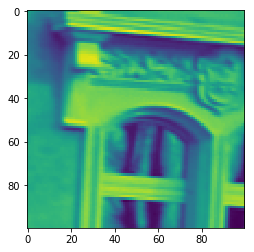

 #### Transformed ####


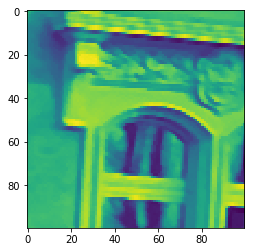

1/1 [==============================] - 0s
 Iteration :  1  ,  2
 #### Original ####


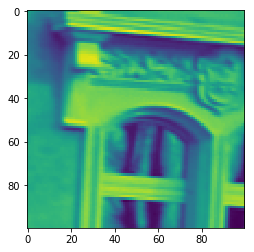

 #### Transformed ####


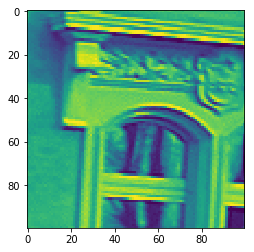

1/1 [==============================] - 0s
 Iteration :  1  ,  3
 #### Original ####


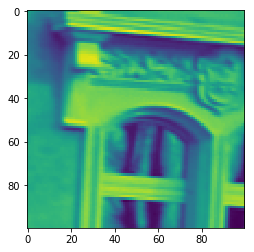

 #### Transformed ####


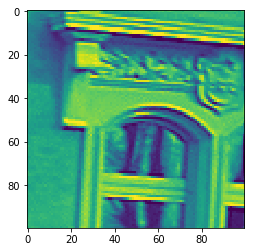

1/1 [==============================] - 0s
 Iteration :  1  ,  4
 #### Original ####


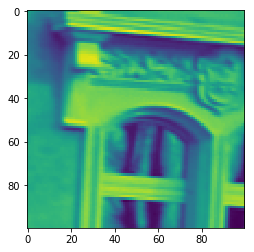

 #### Transformed ####


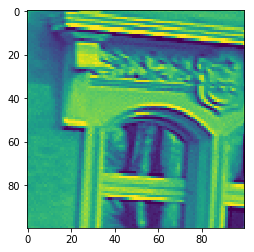

1/1 [==============================] - 0s
 Iteration :  1  ,  5
 #### Original ####


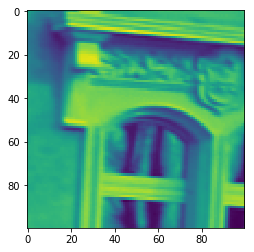

 #### Transformed ####


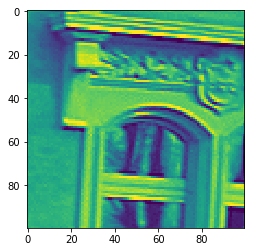

1/1 [==============================] - 0s
 Iteration :  1  ,  6
 #### Original ####


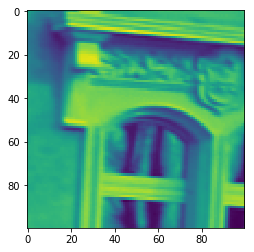

 #### Transformed ####


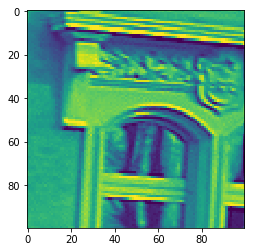

1/1 [==============================] - 0s
 Iteration :  1  ,  7
 #### Original ####


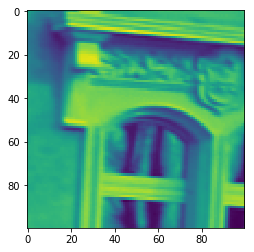

 #### Transformed ####


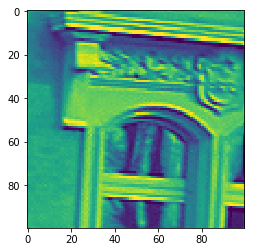

1/1 [==============================] - 0s
 Iteration :  1  ,  8
 #### Original ####


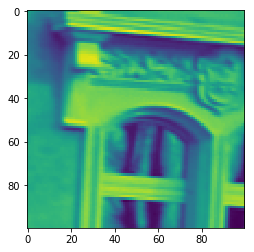

 #### Transformed ####


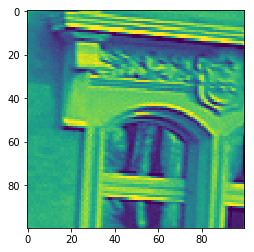

1/1 [==============================] - 0s
 Iteration :  1  ,  9
 #### Original ####


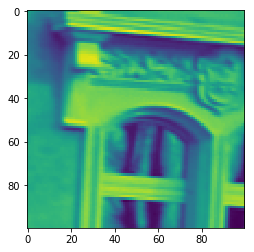

 #### Transformed ####


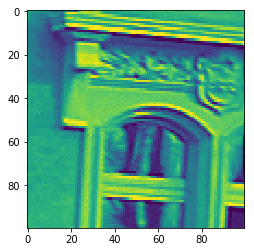

1/1 [==============================] - 0s
 Iteration :  2  ,  1
 #### Original ####


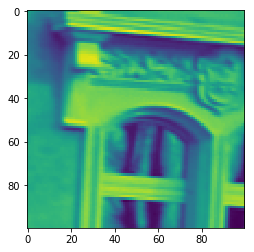

 #### Transformed ####


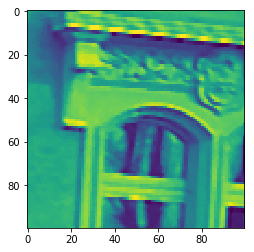

1/1 [==============================] - 0s
 Iteration :  2  ,  2
 #### Original ####


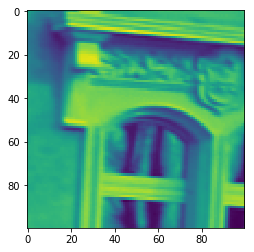

 #### Transformed ####


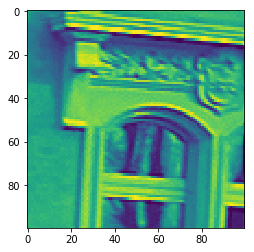

1/1 [==============================] - 0s
 Iteration :  2  ,  3
 #### Original ####


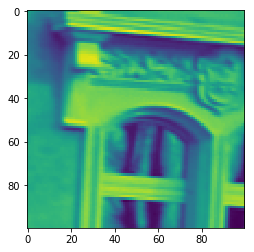

 #### Transformed ####


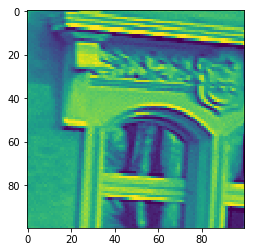

1/1 [==============================] - 0s
 Iteration :  2  ,  4
 #### Original ####


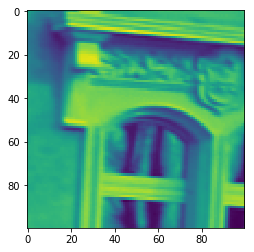

 #### Transformed ####


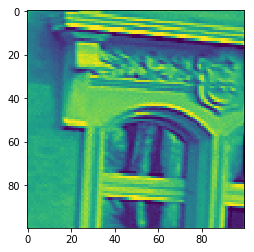

1/1 [==============================] - 0s
 Iteration :  2  ,  5
 #### Original ####


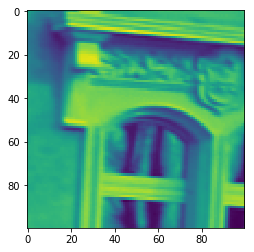

 #### Transformed ####


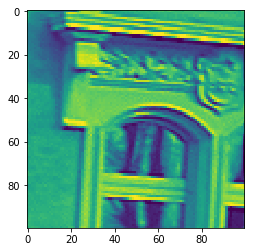

1/1 [==============================] - 0s
 Iteration :  2  ,  6
 #### Original ####


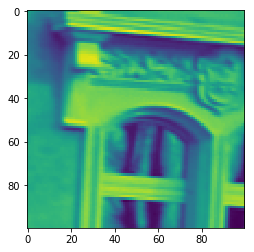

 #### Transformed ####


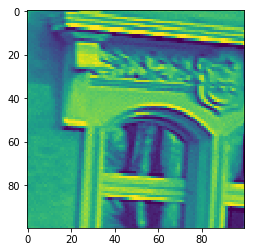

1/1 [==============================] - 0s
 Iteration :  2  ,  7
 #### Original ####


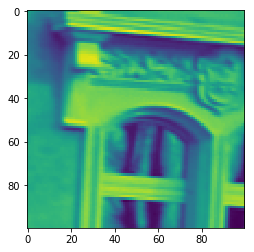

 #### Transformed ####


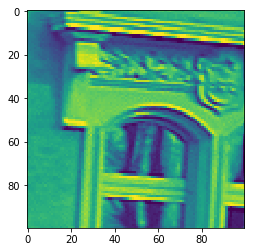

1/1 [==============================] - 0s
 Iteration :  2  ,  8
 #### Original ####


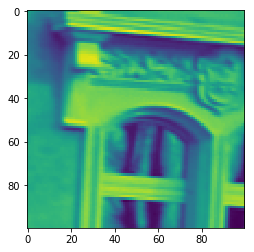

 #### Transformed ####


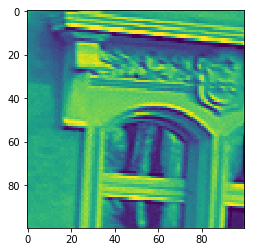

1/1 [==============================] - 0s
 Iteration :  2  ,  9
 #### Original ####


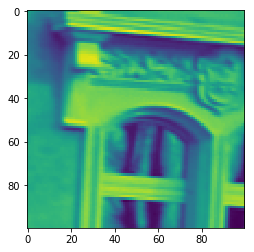

 #### Transformed ####


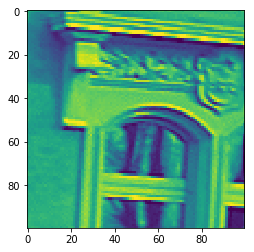

1/1 [==============================] - 0s
 Iteration :  3  ,  1
 #### Original ####


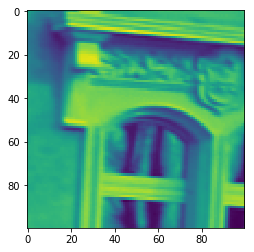

 #### Transformed ####


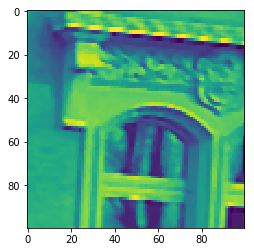

1/1 [==============================] - 0s
 Iteration :  3  ,  2
 #### Original ####


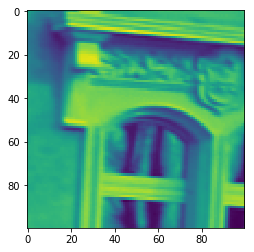

 #### Transformed ####


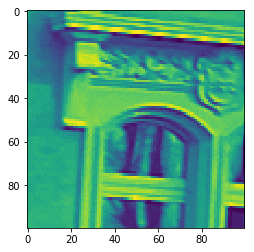

1/1 [==============================] - 0s
 Iteration :  3  ,  3
 #### Original ####


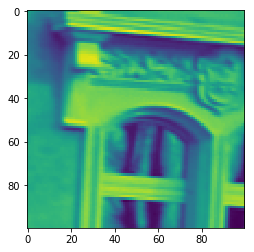

 #### Transformed ####


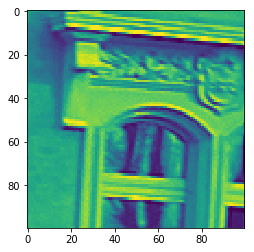

1/1 [==============================] - 0s
 Iteration :  3  ,  4
 #### Original ####


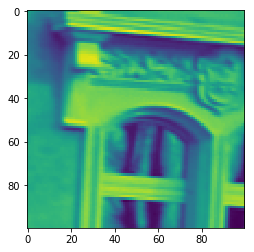

 #### Transformed ####


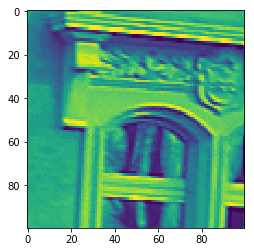

1/1 [==============================] - 0s
 Iteration :  3  ,  5
 #### Original ####


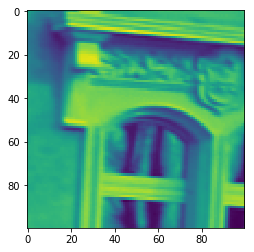

 #### Transformed ####


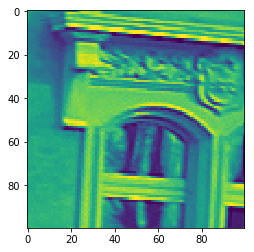

1/1 [==============================] - 0s
 Iteration :  3  ,  6
 #### Original ####


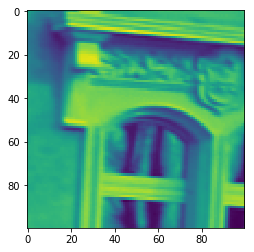

 #### Transformed ####


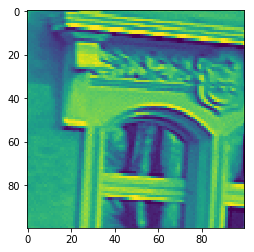

1/1 [==============================] - 0s
 Iteration :  3  ,  7
 #### Original ####


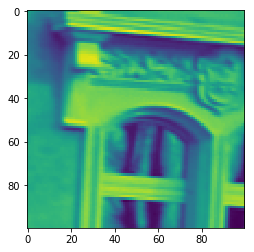

 #### Transformed ####


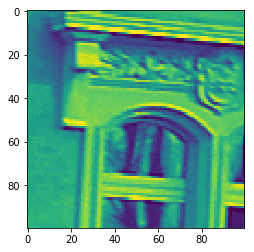

1/1 [==============================] - 0s
 Iteration :  3  ,  8
 #### Original ####


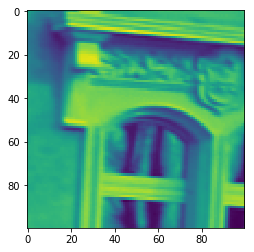

 #### Transformed ####


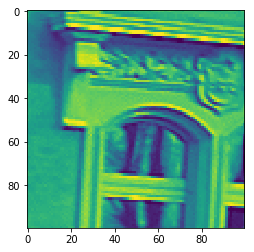

1/1 [==============================] - 0s
 Iteration :  3  ,  9
 #### Original ####


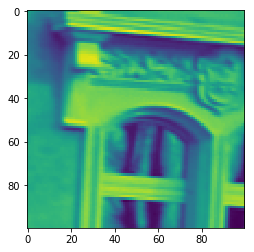

 #### Transformed ####


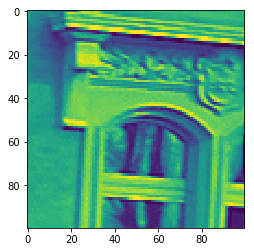

1/1 [==============================] - 0s
 Iteration :  4  ,  1
 #### Original ####


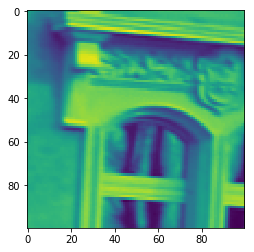

 #### Transformed ####


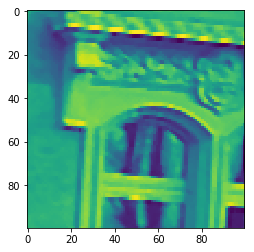

1/1 [==============================] - 0s
 Iteration :  4  ,  2
 #### Original ####


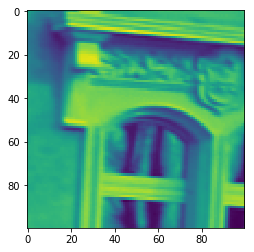

 #### Transformed ####


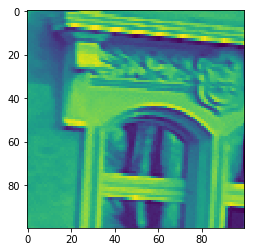

1/1 [==============================] - 0s
 Iteration :  4  ,  3
 #### Original ####


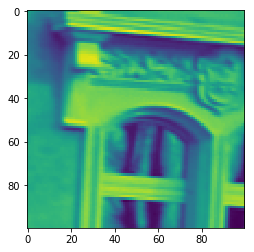

 #### Transformed ####


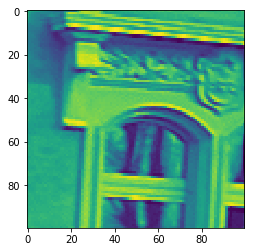

1/1 [==============================] - 0s
 Iteration :  4  ,  4
 #### Original ####


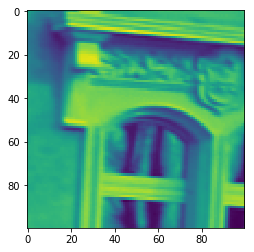

 #### Transformed ####


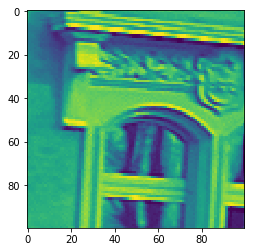

1/1 [==============================] - 0s
 Iteration :  4  ,  5
 #### Original ####


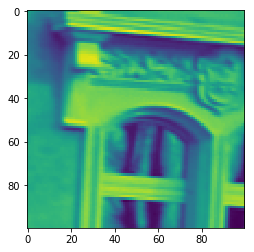

 #### Transformed ####


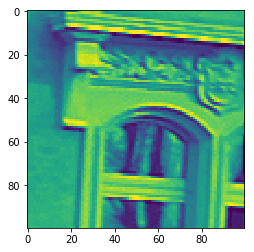

1/1 [==============================] - 0s
 Iteration :  4  ,  6
 #### Original ####


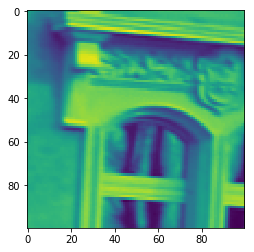

 #### Transformed ####


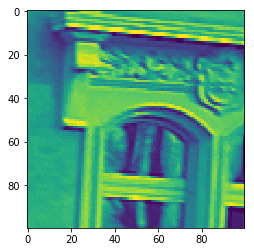

1/1 [==============================] - 0s
 Iteration :  4  ,  7
 #### Original ####


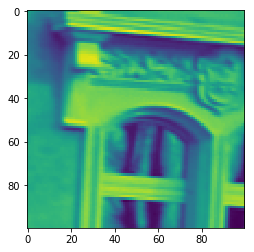

 #### Transformed ####


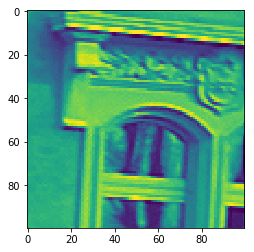

1/1 [==============================] - 0s
 Iteration :  4  ,  8
 #### Original ####


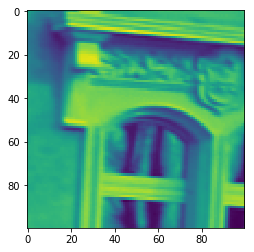

 #### Transformed ####


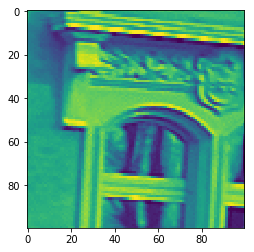

1/1 [==============================] - 0s
 Iteration :  4  ,  9
 #### Original ####


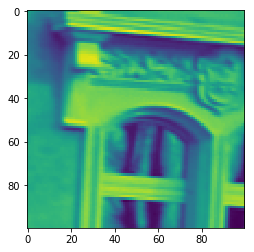

 #### Transformed ####


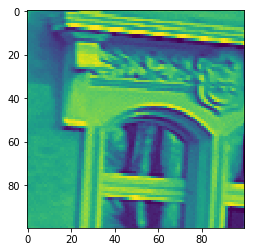

1/1 [==============================] - 0s
 Iteration :  5  ,  1
 #### Original ####


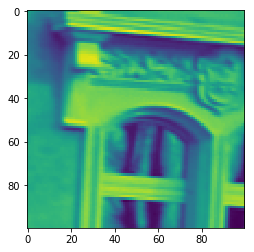

 #### Transformed ####


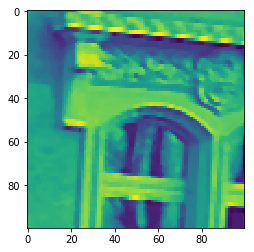

1/1 [==============================] - 0s
 Iteration :  5  ,  2
 #### Original ####


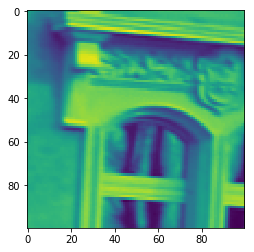

 #### Transformed ####


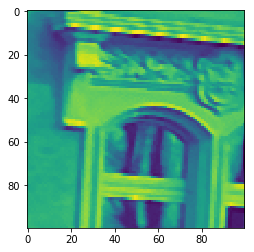

1/1 [==============================] - 0s
 Iteration :  5  ,  3
 #### Original ####


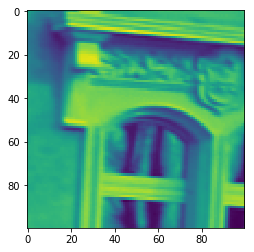

 #### Transformed ####


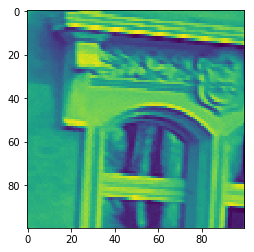

1/1 [==============================] - 0s
 Iteration :  5  ,  4
 #### Original ####


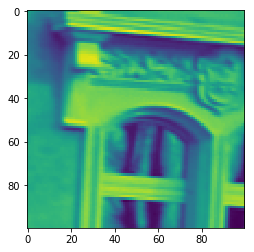

 #### Transformed ####


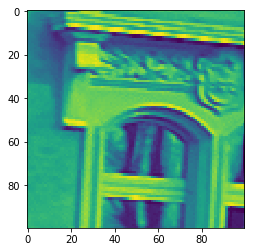

1/1 [==============================] - 0s
 Iteration :  5  ,  5
 #### Original ####


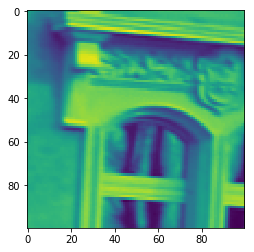

 #### Transformed ####


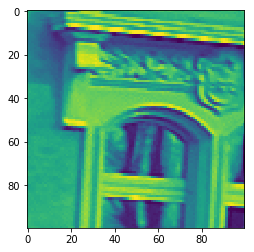

1/1 [==============================] - 0s
 Iteration :  5  ,  6
 #### Original ####


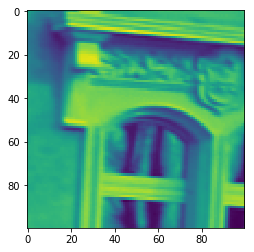

 #### Transformed ####


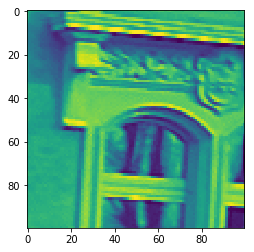

1/1 [==============================] - 0s
 Iteration :  5  ,  7
 #### Original ####


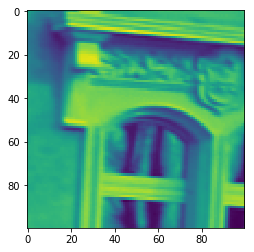

 #### Transformed ####


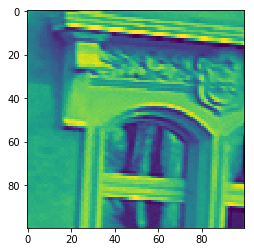

1/1 [==============================] - 0s
 Iteration :  5  ,  8
 #### Original ####


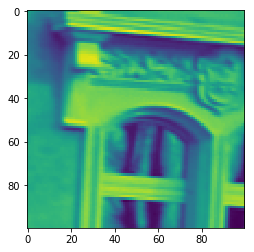

 #### Transformed ####


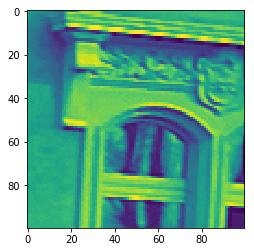

1/1 [==============================] - 0s
 Iteration :  5  ,  9
 #### Original ####


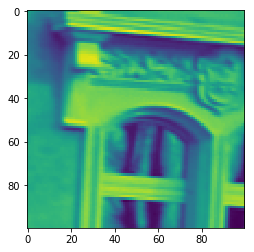

 #### Transformed ####


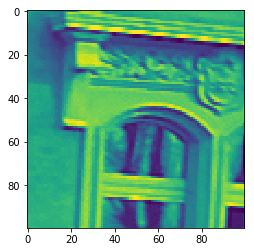

1/1 [==============================] - 0s
 Iteration :  6  ,  1
 #### Original ####


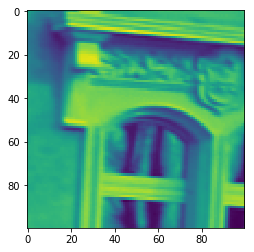

 #### Transformed ####


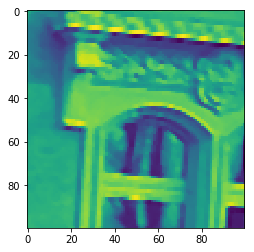

1/1 [==============================] - 0s
 Iteration :  6  ,  2
 #### Original ####


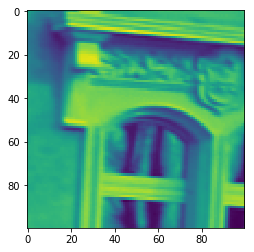

 #### Transformed ####


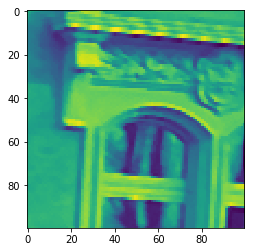

1/1 [==============================] - 0s
 Iteration :  6  ,  3
 #### Original ####


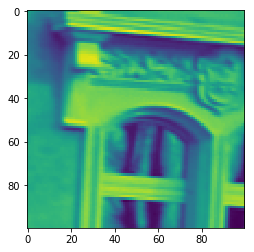

 #### Transformed ####


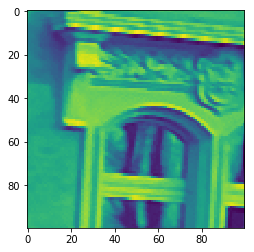

1/1 [==============================] - 0s
 Iteration :  6  ,  4
 #### Original ####


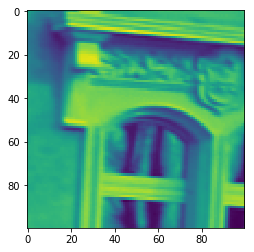

 #### Transformed ####


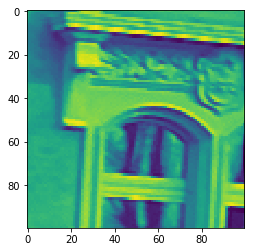

1/1 [==============================] - 0s
 Iteration :  6  ,  5
 #### Original ####


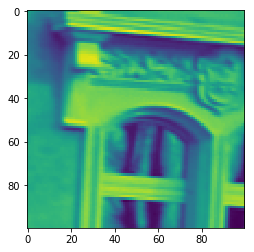

 #### Transformed ####


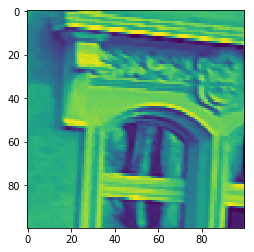

1/1 [==============================] - 0s
 Iteration :  6  ,  6
 #### Original ####


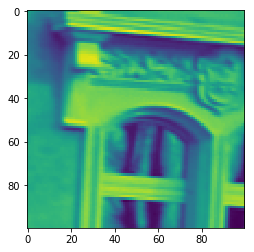

 #### Transformed ####


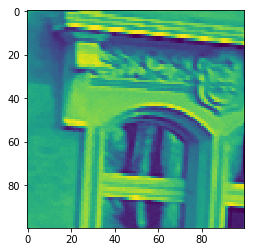

1/1 [==============================] - 0s
 Iteration :  6  ,  7
 #### Original ####


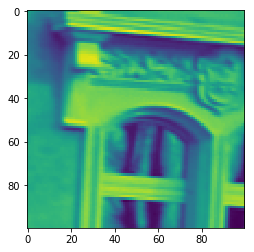

 #### Transformed ####


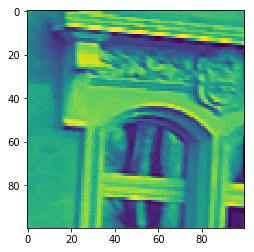

1/1 [==============================] - 0s
 Iteration :  6  ,  8
 #### Original ####


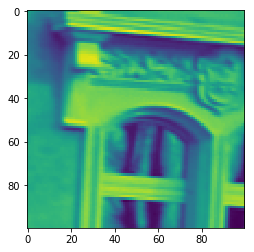

 #### Transformed ####


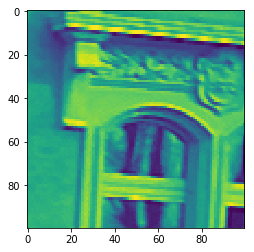

1/1 [==============================] - 0s
 Iteration :  6  ,  9
 #### Original ####


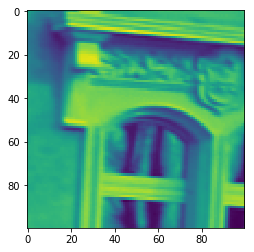

 #### Transformed ####


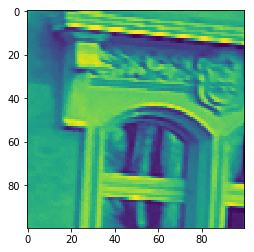

1/1 [==============================] - 0s
 Iteration :  7  ,  1
 #### Original ####


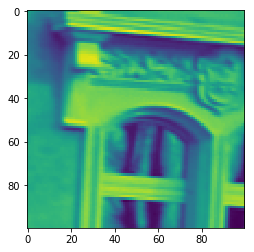

 #### Transformed ####


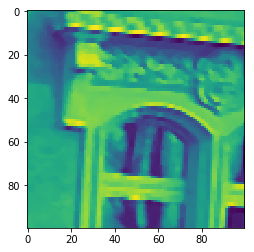

1/1 [==============================] - 0s
 Iteration :  7  ,  2
 #### Original ####


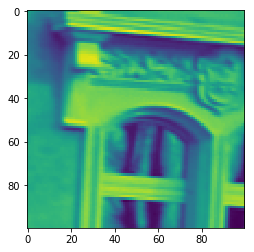

 #### Transformed ####


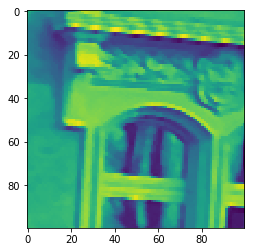

1/1 [==============================] - 0s
 Iteration :  7  ,  3
 #### Original ####


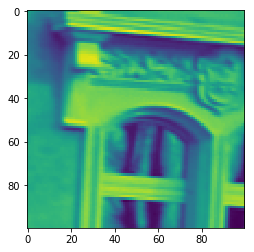

 #### Transformed ####


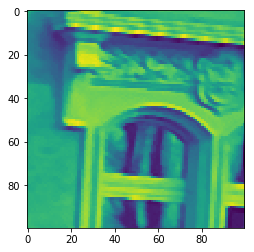

1/1 [==============================] - 0s
 Iteration :  7  ,  4
 #### Original ####


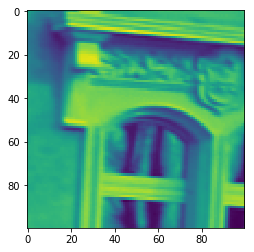

 #### Transformed ####


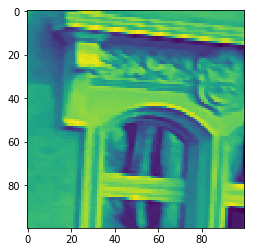

1/1 [==============================] - 0s
 Iteration :  7  ,  5
 #### Original ####


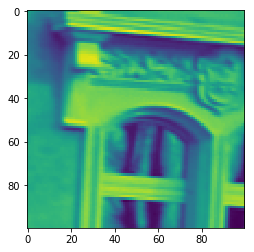

 #### Transformed ####


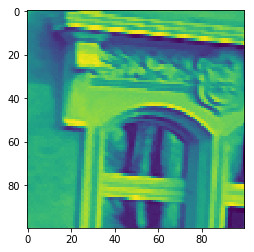

1/1 [==============================] - 0s
 Iteration :  7  ,  6
 #### Original ####


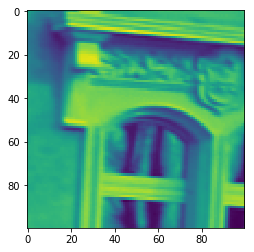

 #### Transformed ####


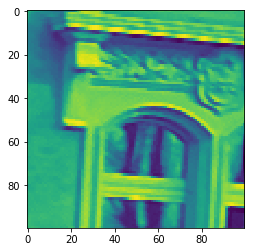

1/1 [==============================] - 0s
 Iteration :  7  ,  7
 #### Original ####


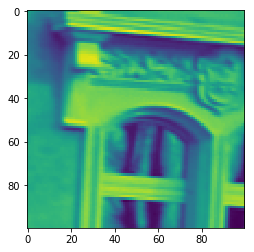

 #### Transformed ####


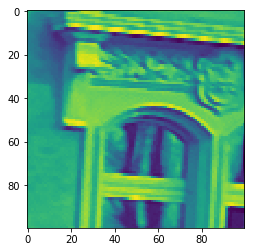

1/1 [==============================] - 0s
 Iteration :  7  ,  8
 #### Original ####


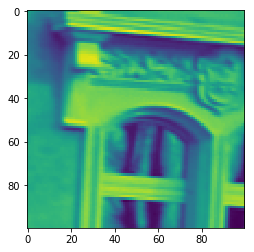

 #### Transformed ####


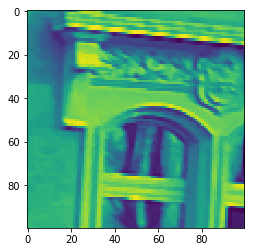

1/1 [==============================] - 0s
 Iteration :  7  ,  9
 #### Original ####


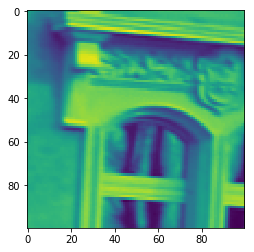

 #### Transformed ####


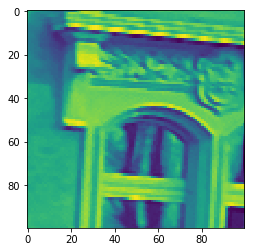

1/1 [==============================] - 0s
 Iteration :  8  ,  1
 #### Original ####


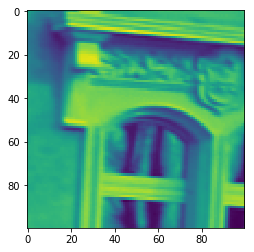

 #### Transformed ####


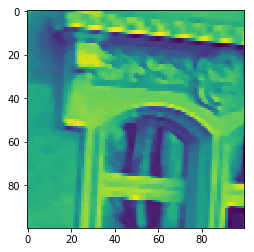

1/1 [==============================] - 0s
 Iteration :  8  ,  2
 #### Original ####


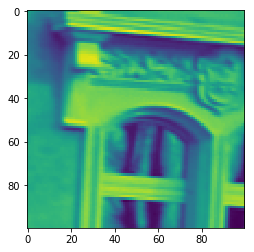

 #### Transformed ####


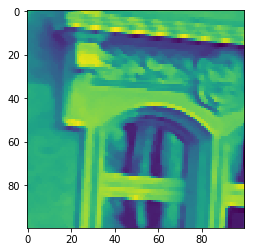

1/1 [==============================] - 0s
 Iteration :  8  ,  3
 #### Original ####


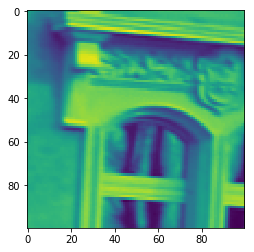

 #### Transformed ####


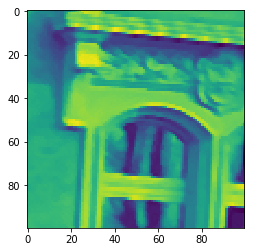

1/1 [==============================] - 0s
 Iteration :  8  ,  4
 #### Original ####


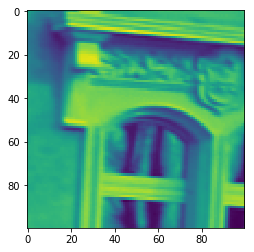

 #### Transformed ####


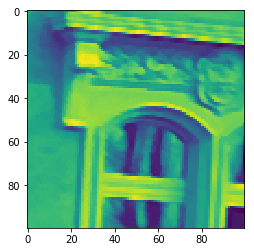

1/1 [==============================] - 0s
 Iteration :  8  ,  5
 #### Original ####


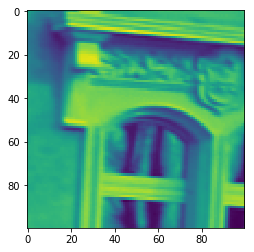

 #### Transformed ####


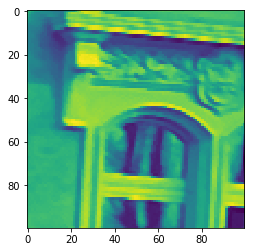

1/1 [==============================] - 0s
 Iteration :  8  ,  6
 #### Original ####


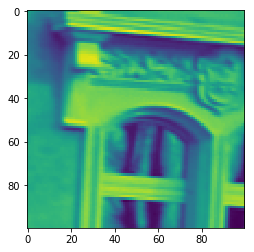

 #### Transformed ####


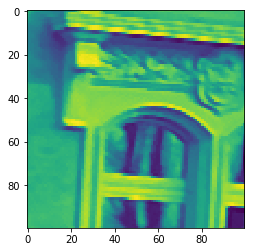

1/1 [==============================] - 0s
 Iteration :  8  ,  7
 #### Original ####


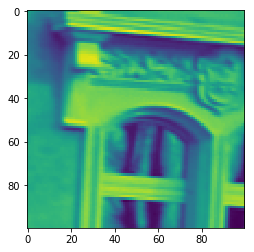

 #### Transformed ####


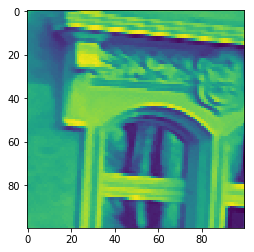

1/1 [==============================] - 0s
 Iteration :  8  ,  8
 #### Original ####


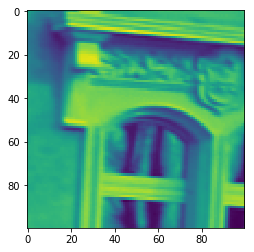

 #### Transformed ####


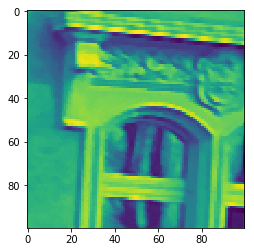

1/1 [==============================] - 0s
 Iteration :  8  ,  9
 #### Original ####


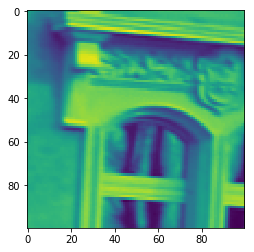

 #### Transformed ####


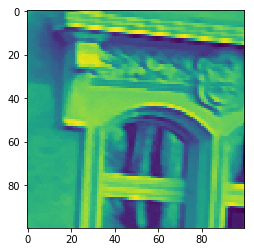

1/1 [==============================] - 0s
 Iteration :  9  ,  1
 #### Original ####


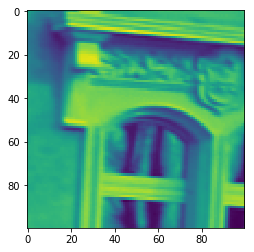

 #### Transformed ####


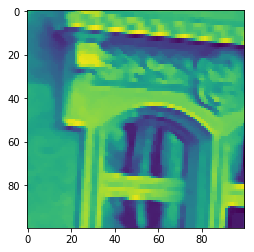

1/1 [==============================] - 0s
 Iteration :  9  ,  2
 #### Original ####


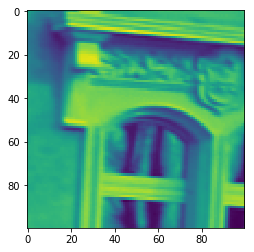

 #### Transformed ####


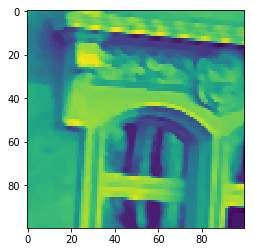

1/1 [==============================] - 0s
 Iteration :  9  ,  3
 #### Original ####


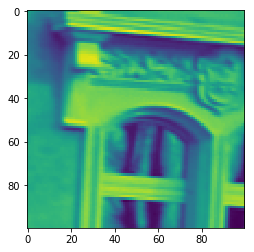

 #### Transformed ####


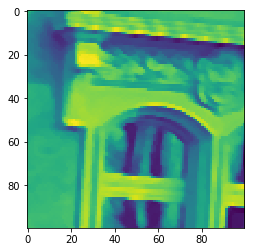

1/1 [==============================] - 0s
 Iteration :  9  ,  4
 #### Original ####


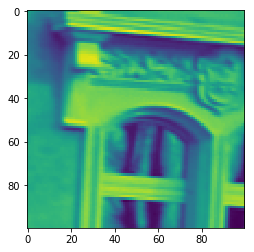

 #### Transformed ####


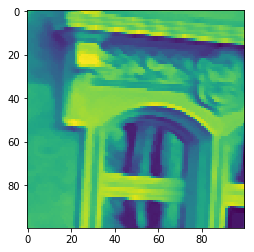

1/1 [==============================] - 0s
 Iteration :  9  ,  5
 #### Original ####


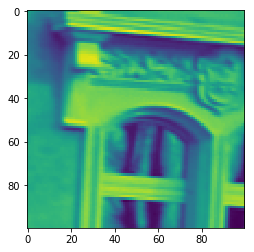

 #### Transformed ####


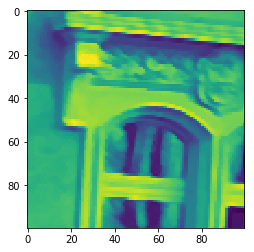

1/1 [==============================] - 0s
 Iteration :  9  ,  6
 #### Original ####


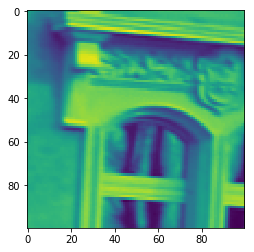

 #### Transformed ####


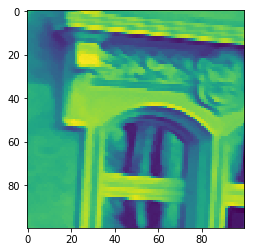

1/1 [==============================] - 0s
 Iteration :  9  ,  7
 #### Original ####


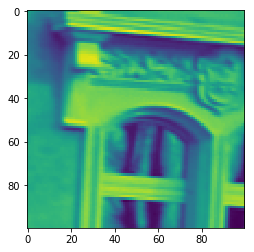

 #### Transformed ####


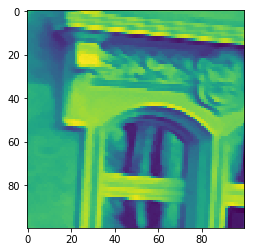

1/1 [==============================] - 0s
 Iteration :  9  ,  8
 #### Original ####


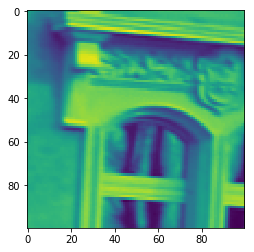

 #### Transformed ####


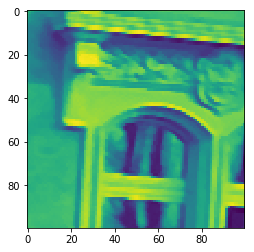

1/1 [==============================] - 0s
 Iteration :  9  ,  9
 #### Original ####


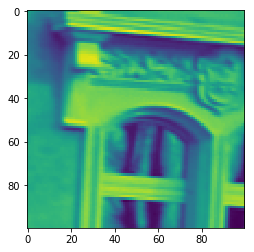

 #### Transformed ####


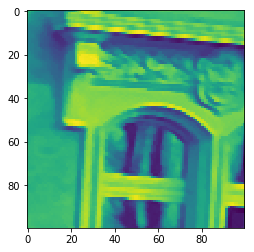

1/1 [==============================] - 0s


In [34]:
Q = {}

for i in range(1,10):
    for j in range(1,10):
        
        median = 0.1 * i
        sharp  = 0.1 * j
        image = median*get_new_state(original_image, "m") + sharp*get_new_state(original_image, "s")
#         print(original_image1 == original_image)
        print(" Iteration : ", i, " , ", j)
        print(" #### Original ####")
        plt.imshow(original_image1)
        plt.show()
        
        print(" #### Transformed ####")
        plt.imshow(image)
        plt.show()
    
#         reward = float(input(" Enter reward : "))
        inp = np.reshape(np.array([original_image1, image]), [1,20000])
        inp = normalize(inp)[0]

        reward = model.predict(np.array([inp]))
        img_tuple = (tuple(x) for x in image)
        Q[img_tuple] = [(i,j), reward]


 iteration :  1   1
 reward :  [[ 0.99349678  0.00650321]]
(100, 100)
(91, 20000)


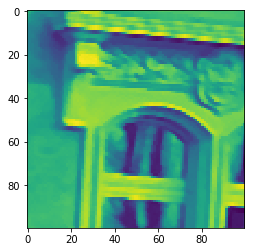

 iteration :  1   2
 reward :  [[  9.99978185e-01   2.17923316e-05]]


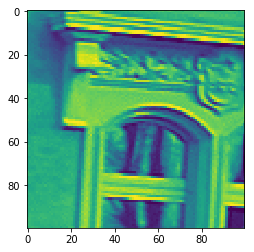

 iteration :  1   3
 reward :  [[  9.99928832e-01   7.11857938e-05]]


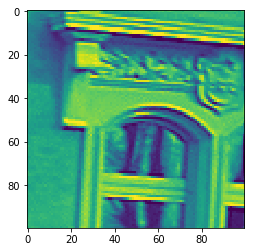

 iteration :  1   4
 reward :  [[  9.99431312e-01   5.68660442e-04]]


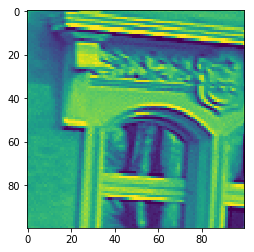

 iteration :  1   5
 reward :  [[ 0.99259335  0.00740664]]


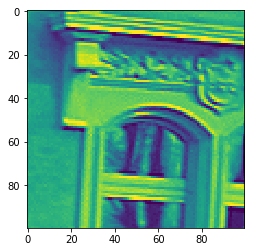

 iteration :  1   6
 reward :  [[ 0.8000769   0.19992308]]


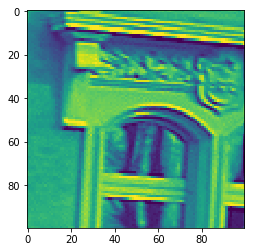

 iteration :  1   7
 reward :  [[ 0.44205618  0.55794382]]


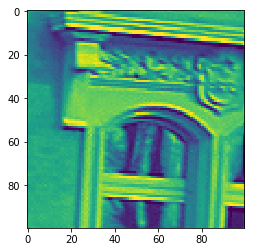

 iteration :  1   8
 reward :  [[ 0.54602313  0.45397684]]


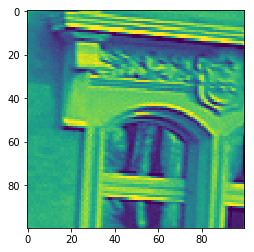

 iteration :  1   9
 reward :  [[ 0.58760566  0.41239432]]


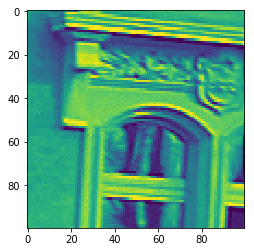

 iteration :  2   1
 reward :  [[  9.99963522e-01   3.64754051e-05]]
(100, 100)
(92, 20000)


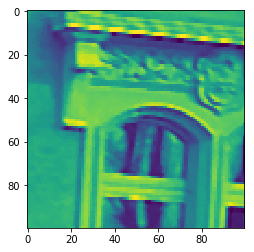

 iteration :  2   2
 reward :  [[  9.99977231e-01   2.28189001e-05]]


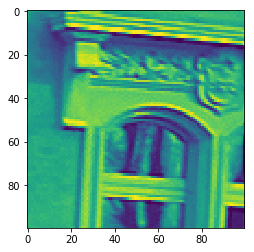

 iteration :  2   3
 reward :  [[  9.99886036e-01   1.13905051e-04]]


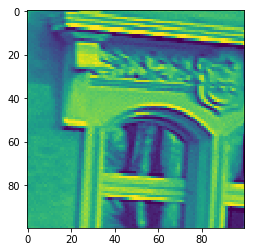

 iteration :  2   4
 reward :  [[ 0.99879229  0.00120768]]


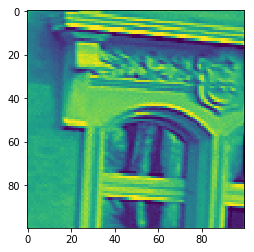

 iteration :  2   5
 reward :  [[ 0.96906888  0.03093118]]


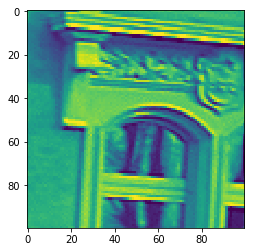

 iteration :  2   6
 reward :  [[ 0.43293992  0.56706005]]


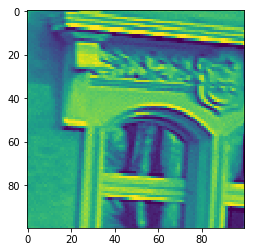

 iteration :  2   7
 reward :  [[ 0.51232469  0.48767525]]


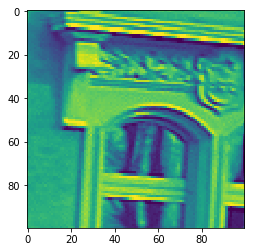

 iteration :  2   8
 reward :  [[ 0.58737606  0.41262394]]


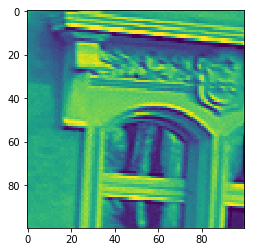

 iteration :  2   9
 reward :  [[ 0.56758338  0.43241659]]
(100, 100)
(93, 20000)


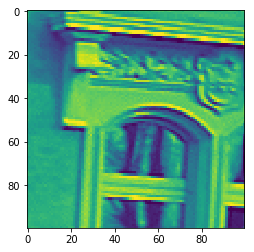

 iteration :  3   1
 reward :  [[  9.99640703e-01   3.59278405e-04]]
(100, 100)
(94, 20000)


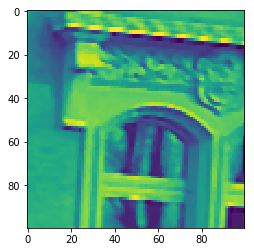

 iteration :  3   2
 reward :  [[  9.99933124e-01   6.68521097e-05]]


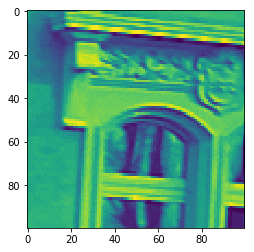

 iteration :  3   3
 reward :  [[  9.99736011e-01   2.63988302e-04]]


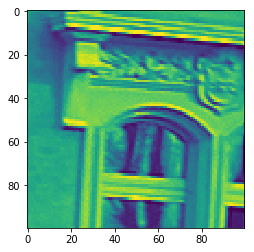

 iteration :  3   4
 reward :  [[ 0.99649316  0.00350683]]


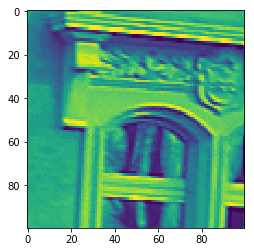

 iteration :  3   5
 reward :  [[ 0.82417732  0.17582263]]


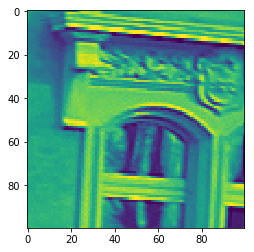

 iteration :  3   6
 reward :  [[ 0.46438193  0.53561813]]


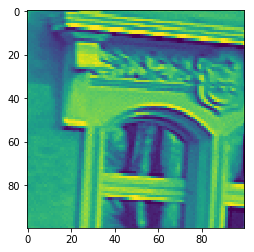

 iteration :  3   7
 reward :  [[ 0.58569443  0.41430557]]
(100, 100)
(95, 20000)


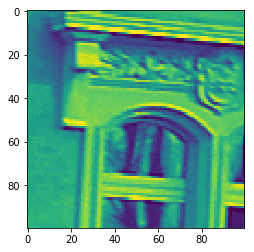

 iteration :  3   8
 reward :  [[ 0.5703913   0.42960873]]


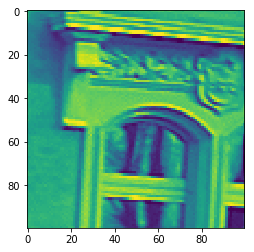

 iteration :  3   9
 reward :  [[ 0.5170244   0.48297557]]


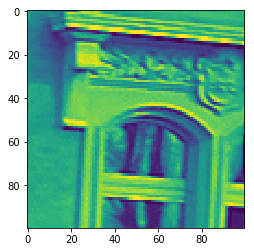

 iteration :  4   1
 reward :  [[ 0.98763382  0.01236622]]
(100, 100)
(96, 20000)


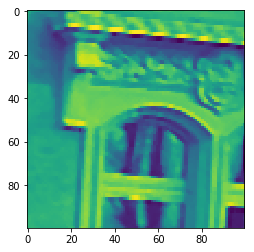

 iteration :  4   2
 reward :  [[  9.99530077e-01   4.69906372e-04]]
(100, 100)
(97, 20000)


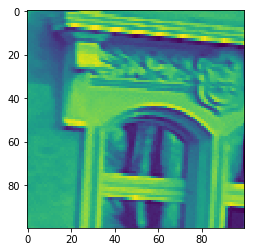

 iteration :  4   3
 reward :  [[ 0.99887234  0.00112769]]


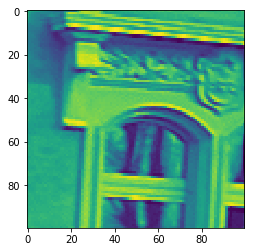

 iteration :  4   4
 reward :  [[ 0.97805423  0.02194579]]
(100, 100)
(98, 20000)


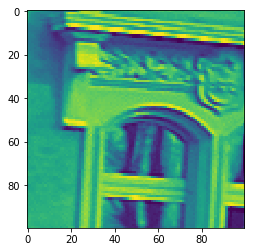

 iteration :  4   5
 reward :  [[ 0.4042668   0.59573317]]
(100, 100)
(99, 20000)


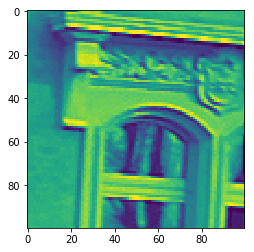

 iteration :  4   6
 reward :  [[ 0.54806215  0.45193785]]


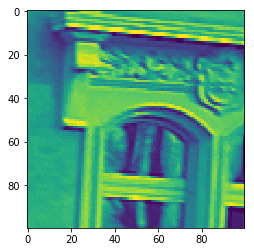

 iteration :  4   7
 reward :  [[ 0.57284677  0.4271532 ]]


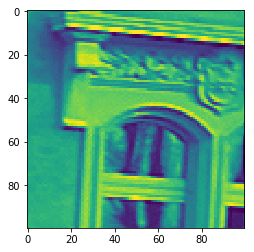

 iteration :  4   8
 reward :  [[ 0.51167774  0.48832223]]


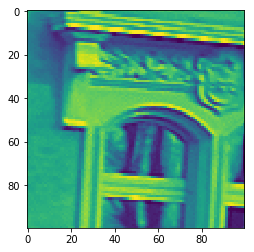

 iteration :  4   9
 reward :  [[ 0.47501466  0.52498537]]


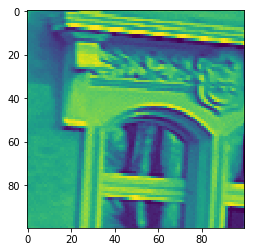

 iteration :  5   1
 reward :  [[ 0.43317014  0.56682992]]
(100, 100)
(100, 20000)


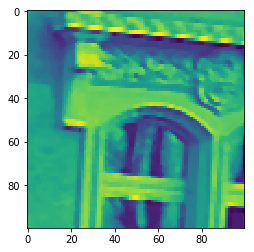

 iteration :  5   2
 reward :  [[ 0.98207539  0.0179246 ]]


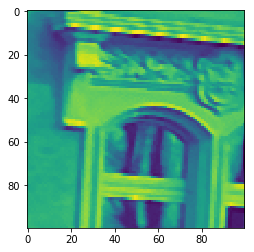

 iteration :  5   3
 reward :  [[ 0.97737795  0.02262211]]


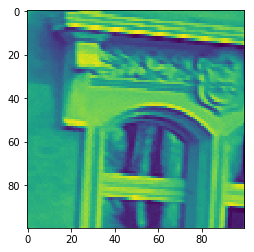

 iteration :  5   4
 reward :  [[ 0.62676167  0.3732383 ]]


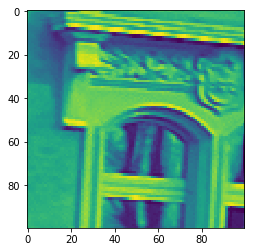

 iteration :  5   5
 reward :  [[ 0.50083333  0.49916667]]


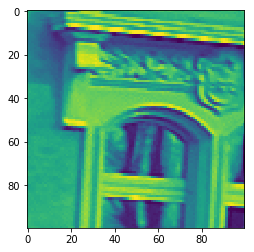

 iteration :  5   6
 reward :  [[ 0.57453483  0.42546514]]
(100, 100)
(101, 20000)


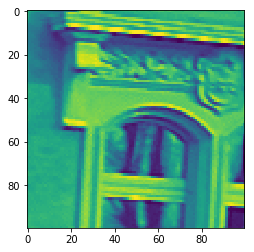

 iteration :  5   7
 reward :  [[ 0.50853741  0.49146256]]
(100, 100)
(102, 20000)


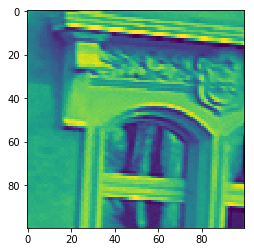

 iteration :  5   8
 reward :  [[ 0.44931805  0.55068201]]


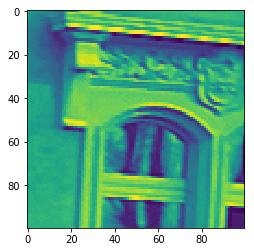

 iteration :  5   9
 reward :  [[ 0.22045055  0.77954948]]


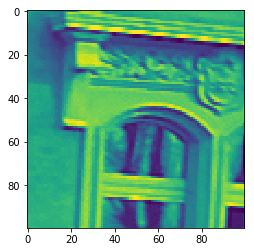

 iteration :  6   1
 reward :  [[ 0.55576694  0.44423306]]


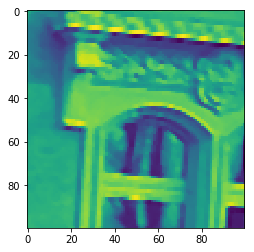

 iteration :  6   2
 reward :  [[ 0.45045432  0.54954565]]


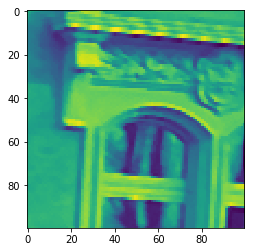

 iteration :  6   3
 reward :  [[ 0.42816049  0.57183951]]


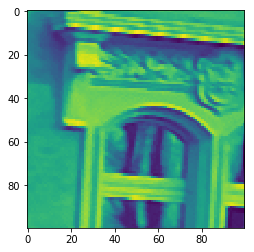

 iteration :  6   4
 reward :  [[ 0.50857168  0.49142832]]


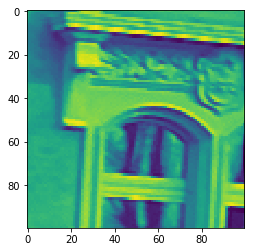

 iteration :  6   5
 reward :  [[ 0.56692052  0.43307948]]
(100, 100)
(103, 20000)


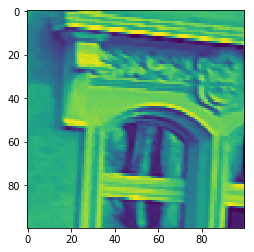

 iteration :  6   6
 reward :  [[ 0.50033289  0.49966711]]


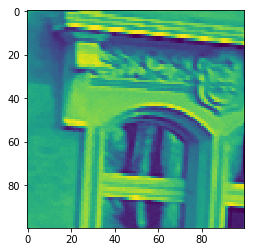

 iteration :  6   7
 reward :  [[ 0.4002443  0.5997557]]


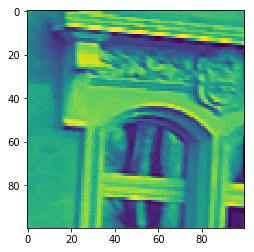

 iteration :  6   8
 reward :  [[ 0.23039471  0.76960534]]


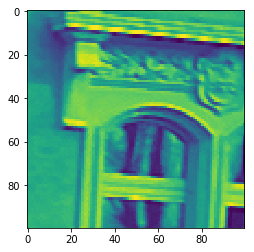

 iteration :  6   9
 reward :  [[ 0.89150631  0.10849366]]
(100, 100)
(104, 20000)


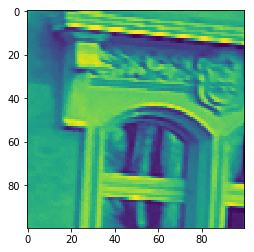

 iteration :  7   1
 reward :  [[ 0.34732056  0.65267944]]


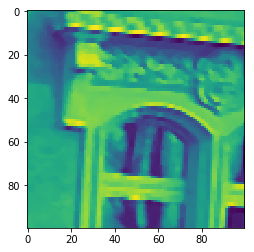

 iteration :  7   2
 reward :  [[ 0.47563964  0.52436036]]


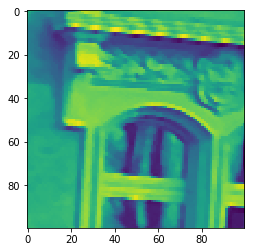

 iteration :  7   3
 reward :  [[ 0.5047487   0.49525136]]


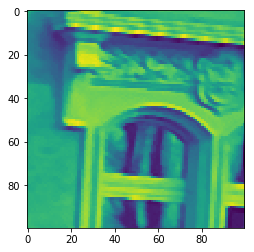

 iteration :  7   4
 reward :  [[ 0.48513302  0.51486695]]


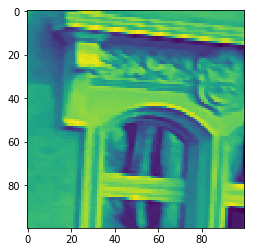

 iteration :  7   5
 reward :  [[ 0.45469984  0.54530013]]
(100, 100)
(105, 20000)


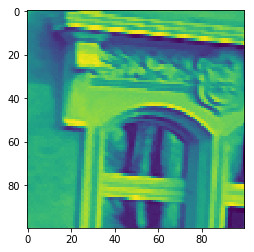

 iteration :  7   6
 reward :  [[ 0.2279502   0.77204978]]


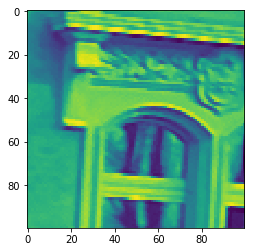

 iteration :  7   7
 reward :  [[ 0.50503612  0.49496391]]


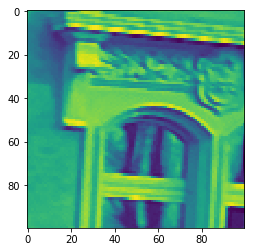

 iteration :  7   8
 reward :  [[ 0.96452469  0.03547532]]


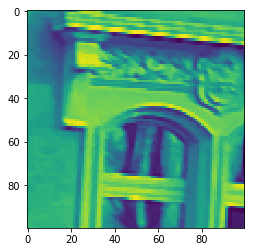

 iteration :  7   9
 reward :  [[ 0.98871607  0.01128393]]
(100, 100)
(106, 20000)


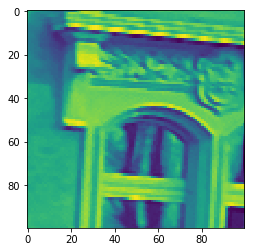

 iteration :  8   1
 reward :  [[ 0.7547642   0.24523573]]


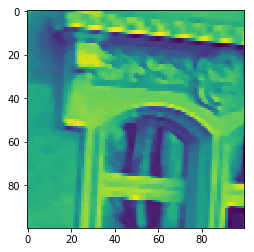

 iteration :  8   2
 reward :  [[ 0.11283445  0.88716555]]


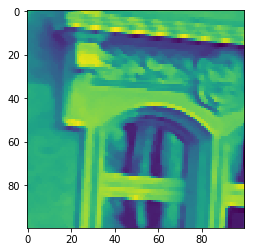

 iteration :  8   3
 reward :  [[ 0.06380347  0.93619651]]
(100, 100)
(107, 20000)


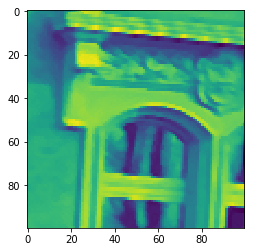

 iteration :  8   4
 reward :  [[ 0.15659933  0.84340066]]


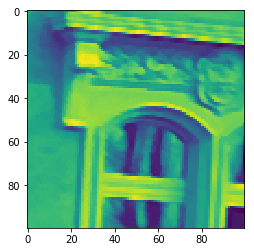

 iteration :  8   5
 reward :  [[ 0.67920518  0.32079482]]


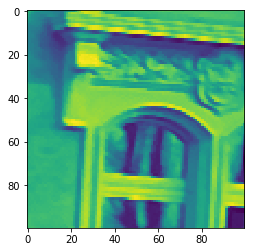

 iteration :  8   6
 reward :  [[ 0.96684027  0.03315967]]
(100, 100)
(108, 20000)


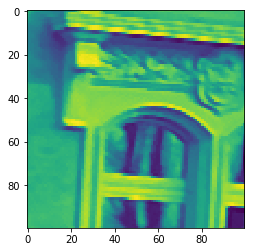

 iteration :  8   7
 reward :  [[ 0.98677605  0.01322389]]


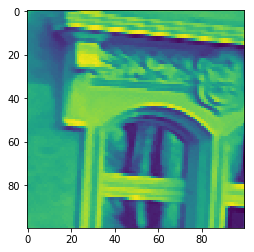

 iteration :  8   8
 reward :  [[ 0.9723714   0.02762864]]


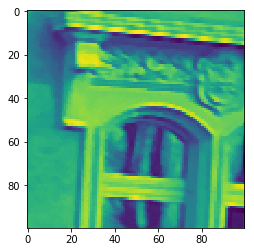

 iteration :  8   9
 reward :  [[ 0.92545658  0.07454337]]


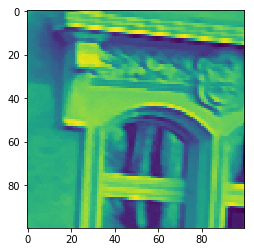

 iteration :  9   1
 reward :  [[ 0.96449548  0.0355045 ]]
(100, 100)
(109, 20000)


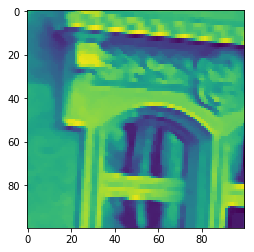

 iteration :  9   2
 reward :  [[ 0.97266024  0.02733982]]
(100, 100)
(110, 20000)


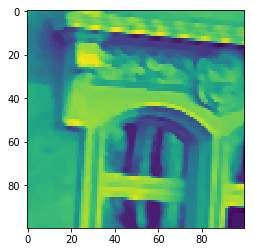

 iteration :  9   3
 reward :  [[ 0.97045982  0.02954019]]
(100, 100)
(111, 20000)


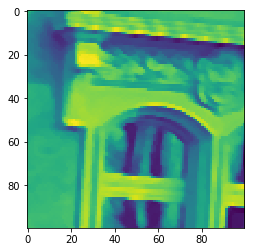

 iteration :  9   4
 reward :  [[ 0.95771736  0.0422826 ]]
(100, 100)
(112, 20000)


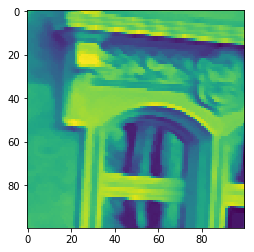

 iteration :  9   5
 reward :  [[ 0.92565715  0.07434285]]
(100, 100)
(113, 20000)


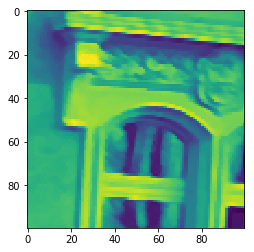

 iteration :  9   6
 reward :  [[ 0.86049616  0.13950385]]
(100, 100)
(114, 20000)


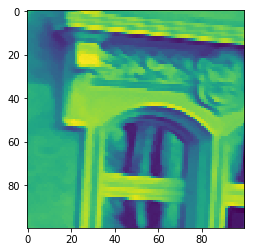

 iteration :  9   7
 reward :  [[ 0.74952471  0.25047529]]
(100, 100)
(115, 20000)


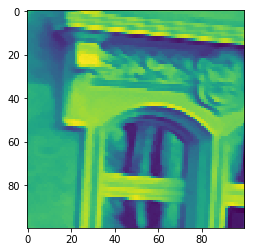

 iteration :  9   8
 reward :  [[ 0.66033763  0.3396624 ]]
(100, 100)
(116, 20000)


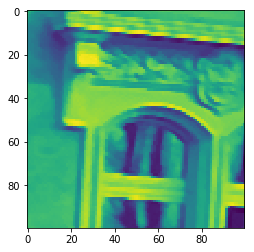

 iteration :  9   9
 reward :  [[ 0.62848073  0.37151918]]
(100, 100)
(117, 20000)


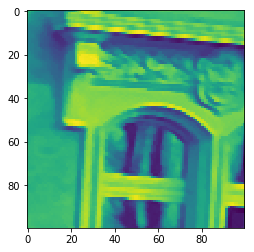

In [35]:
print_Q_table(Q, x, y)

In [36]:
def vgg16_model(self):
    #Get back the convolutional part of a VGG network trained on ImageNet
    model_vgg16_conv = VGG16(weights=None, include_top=False)
    #model_vgg16_conv.summary()

    # Input
    input = Input(shape=(2,100,100),name = 'image_input')

    #Use the generated model 
    output_vgg16_conv = model_vgg16_conv(input)

    #Add the fully-connected layers 
    x = Flatten(name='flatten')(output_vgg16_conv)
    x = Dense(200, name='fc1')(x)
    x = Dense(50, name='fc2')(x)
    x = Dense(2, name='fc3')(x)

    model = Model(input=input, output=x)
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    return model